<h4 align="center">Lab n°3 de Machine Learning<small> - réalisé par DMiners - 4DS1</small></h4>
<h1 align="center">Analyse prédictive des sinistres automobiles corporels</h1><br><br><br>
<h2>Contexte du projet</h2><br>
En mars 2010, l’Assemblée générale des Nations Unies a adopté la résolution A/RES/64/255, par laquelle elle proclame la décennie 2011-2020 <strong>Décennie d’action pour la sécurité routière</strong> en vue de stabiliser puis de réduire le nombre prévu de décès imputables aux accidents de la route dans le monde en multipliant les activités menées aux niveaux national, régional et mondial.<br>

Suite à un appel d'offre de la part du gouvernement francais; visant une étude complète de l'efficacité de cette campagne de sensibilisation menée par les Nations Unies, et quelles mesures métiers pragmatiques à prendre, nous sommes ainsi amenés à créer un Dashboard de support pour les projets d'intervention et maintenance au niveau de la structure de la carte routière, en fournissant des prédictions temporelles permettant de prévoir les détails des années prochaines concernant notre étude pour soutenir les services de santé et de secours SOS.
<table><tr><td><img src="frImg.png" width="250px"></td><td><img src="UNlogo.jpg" width="150px"></td><td><img src="decennie.jpg" width="150px"></td></tr></table><br>
<h2>Données entre sources et analyse</h2><br>
Dans ce cas d’étude, pour achever nos objectifs métier, on sera donc amené à passer par une étude intensive des données. On s'intéressera ainsi aux statistiques de cette période de la décennie courante 2011-2017 en prenant de même, l'année 2010 comme année de référence de ce qui précède. Pour les mêmes raisons, une telle étude nécessite qu'on ait une vision globale au niveau des données analysées, c'est pour cela qu'on aura aussi recours au mine et chargement de données depuis différentes ressources externes.<br><br>

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd

# caracteristiques dataframes import
carac_list = []
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2010.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2011.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2012.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2013.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2014.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2015.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2016.csv", encoding="ISO-8859-1", dtype='unicode'))
carac_list.append(pd.read_csv("../data/datagov/caracteristiques_2017.csv", encoding="ISO-8859-1", dtype='unicode'))

# décodage colonnes
for carac in carac_list:
    carac.rename(columns={
        'Num_Acc':'num_acc',
        'hrmn':'heure_min',
        'agg':'localisation',
        'int':'intersection',
        'atm':'meteo',
        'col':'type_collision',
        'com':'commune',
        'dep':'departement'
    }, inplace=True)
    carac.drop(['long', 'lat', 'adr', 'gps'], axis=1, inplace=True)

# lieux dataframes import
lieux_list = []
lieux_list.append(pd.read_csv("../data/datagov/lieux_2010.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2011.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2012.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2013.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2014.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2015.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2016.csv", encoding="ISO-8859-1", dtype='unicode'))
lieux_list.append(pd.read_csv("../data/datagov/lieux_2017.csv", encoding="ISO-8859-1", dtype='unicode'))

# décodage colonnes
for lieux in lieux_list:
    lieux.rename(columns={
        'Num_Acc':'num_acc',
        'catr':'categorie_route',
        'voie':'numero_route',
        'circ':'regime_circulation',
        'nbv':'nbre_voies',
        'vosp':'voie_reserv_exist',
        'prof':'declivite_route_acc',
        'plan':'align_route',
        'lartpc':'largeur_tpc',
        'larrout':'largeur_route',
        'surf':'etat_surface',
        'infra':'infrastructure',
        'situ':'local_accident',
        'env1':'proximite_ecole'
    }, inplace=True)
    lieux.drop(['v1', 'v2', 'pr', 'pr1'], axis=1, inplace=True)

# usagers dataframes import
usagers_list = []
usagers_list.append(pd.read_csv("../data/datagov/usagers_2010.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2011.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2012.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2013.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2014.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2015.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2016.csv", encoding="ISO-8859-1", dtype='unicode'))
usagers_list.append(pd.read_csv("../data/datagov/usagers_2017.csv", encoding="ISO-8859-1", dtype='unicode'))

# décodage colonnes
for usagers in usagers_list:
    usagers.rename(columns={
        'Num_Acc':'num_acc',
        'Num_Veh':'num_veh',
        'place':'place_usager',
        'catu':'categorie_usager',
        'grav':'gravite_etat',
        'An_nais':'an_nais',
        'secu':'securite_utilisation',
        'locp':'local_pieton',
        'actp':'action_pieton'
    }, inplace=True)
    usagers.drop(['etatp'], axis=1, inplace=True)

# vehicules dataframes import
vehicules_list = []
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2010.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2011.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2012.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2013.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2014.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2015.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2016.csv", encoding="ISO-8859-1", dtype='unicode'))
vehicules_list.append(pd.read_csv("../data/datagov/vehicules_2017.csv", encoding="ISO-8859-1", dtype='unicode'))

# décodage colonnes
for vehicules in vehicules_list:
    vehicules.rename(columns={
        'Num_Acc':'num_acc',
        'Num_Veh':'num_veh',
        'catv':'categorie_vehicule',
        'obs':'obstacle_fixe',
        'obsm':'obstacle_mobile',
        'choc':'point_choc',
        'manv':'manoeuvre'
    }, inplace=True)
    vehicules.drop(['senc', 'occutc'], axis=1, inplace=True)

<br>
On s'est permis donc, durant l'importation des données, d'éliminer des colonnes suivant les résultats de notre étude intensive des validités des données (l'absence d'un grand pourcentage des NA affectant l'utilité de la colonne) et des associations logiques dont on peut citer l'élimination des colonnes portant de l'information qui peut être dérivée d'autres colonnes (comme par exemple la déduction des "lat" et "long" depuis la colonne "gps").
<br><br>

In [2]:
# transforming functions & dictionnaries

## caracteristiques 

def to_time(x):
    if (len(str(x)) == 4):
        return str(x)[0:2] + ':' + str(x)[2:]
    elif (len(str(x)) == 3):
        return '0' + str(x)[0:1] + ':' + str(x)[1:]
    elif (len(str(x)) == 2):
        return '00:' + str(x)
    elif (len(str(x)) == 1):
        return '00:0' + str(x)
    else:
        return 'Pas définie'

lum_modalites = [
    'Pas définie', 'Plein Jour', 'Crépuscule ou aube', 'Nuit sans éclairage public',
    'Nuit avec éclairage public non allumé', 'Nuit avec éclairage public allumé'
]
localisation_modalites = ['Pas définie', 'Hors agglomération', 'En agglomération']
intersection_modalites = [
    'Pas définie', 'Hors intersection', 'Intersection en X', 'Intersection en T', 'Intersection en Y',
    'Intersection à plus de 4 branches', 'Giratoire', 'Place', 'Passage à niveau', 'Autre intersection'
]
meteo_modalites = [
    'Pas définie', 'Normale', 'Pluie légère', 'Pluie forte', 'Neige - grêle', 'Brouillard - fumée',
    'Vent fort - tempête', 'Temps éblouissant', 'Temps couvert', 'Autre'
]
type_collision_modalites = [
    'Pas définie', 'Deux véhicules - frontale', "Deux véhicules - par l'arrière", 'Deux véhicules - par le côté',
    'Trois véhicules et plus - en chaîne', 'Trois véhicules et plus - collisions multiples',
    'Autre collision', 'Sans collision'
]

## lieux

catr_modalites = [
    'Pas définie', 'Autoroute', 'Route Nationale', 'Route Départementale', 'Voie Communale',
    'Hors réseau public', 'Parc de stationnement ouvert à la circulation publique',
    'nothing1', 'nothing2', 'Autre'
]
circ_modalites = [
    'Pas définie', 'A sens unique', 'Bidirectionnelle',
    'À chaussées séparées', "Avec voies d'affectation variable"
]
vosp_modalites = ['Pas définie', 'Pise cyclable', 'Banque cyclable', 'Voie réservée']
prof_modalites = ['Pas définie', 'Plat', 'Pente', 'Sommet de côte', 'Bas de côte']
plan_modalites = ['Pas définie', 'Partie rectiligne', 'En courbe à gauche', 'En courbe à droite', "En 'S'"]
surf_modalites = [
    'Pas définie', 'Normale', 'Mouillée', 'Flaques', 'Inondée',
    'Enneigée', 'Boue', 'Verglacée', 'Corps gras - huile', 'Autre'
]
infra_modalites = [
    'Pas définie', 'Souterrain - tunnel', 'Pont - autopont', "Bretelle d'échangeur ou  de raccordement",
    'Voie ferrée', 'Carrefour aménagé', 'Zone piétonne', 'Zone de péage'
]
situ_modalites = [
    'Pas définie', 'Sur chaussée', "Sur bande d'arrêt d'urgence",
    'Sur accotement', 'Sur trottoir', 'Sur piste cyclable'
]

## usagers

catu_modalites = ['Pas définie', 'Conducteur', 'Passager', 'Piéton', 'Piéton en roller ou en trotinette']
sexe_modalites = ['Pas définie', 'Masculin', 'Féminin']
grav_modalites = ['Pas définie', 'Indemne', 'Tué', 'Blessé hospitalisé', 'Blessé léger']
trajet_modalites = [
    'Pas définie', 'Domicile - travail', 'Domicile - école', 'Courses - achats',
    'Utilisation professionnelle', 'Promenade - loisirs', 'nothing1', 'nothing2', 'nothing3', 'Autre'
]
secu1_modalites = [
    'Pas définie - ', 'Ceinture - ', 'Casque - ', 'Dispositif enfants - ', 'Equipement réfléchissant - ',
    'nothing1 - ', 'nothing2 - ', 'nothing3 - ', 'nothing4 - ', 'Autre'
]
secu2_modalites = ['Pas définie', 'Oui', 'Non', 'Non déterminable']
locp_modalites = [
    'Pas définie', 'A + 50 m du passage piéton', 'A - 50 m du passage piéton', 'Sans signalisation lumineuse',
    'Avec signalisation lumineuse', 'Sur trottoir', 'Sur accotement', 'Sur refuge ou BAU', 'Sur contre allée'
]
actp_modalites = [
    'non renseigné ou sans objet', 'Sens véhicule heurtant', 'Sens inverse du véhicule', 'Traversant',
    'Masqué', 'Jouant - courant', 'Avec animal', 'nothing1', 'nothing2', 'Autre', 'Pas définie'
]

## vehicules

catv_modalites = {
    '00':'Pas définie', '01':'Bicyclette', '02':'Cyclomoteur <50cm3',
    '03':'Voiturette (Quadricycle à moteur carrossé) (anciennement "voiturette ou tricycle à moteur")',
    '04':'Référence plus utilisée depuis 2006 (scooter immatriculé)',
    '05':'Référence plus utilisée depuis 2006 (motocyclette)',
    '06':'Référence plus utilisée depuis 2006 (side-car)', '07':'VL seul',
    '08':'Catégorie plus utilisée (VL + caravane)', '09':'Catégorie plus utilisée (VL + remorque)',
    '10':'VU seul 1,5T <= PTAC <= 3,5T avec ou sans remorque (anciennement VU seul 1,5T <= PTAC <= 3,5T)',
    '11':'Référence plus utilisée depuis 2006 (VU (10) + caravane)',
    '12':'Référence plus utilisée depuis 2006 (VU (10) + remorque)', '13':'PL seul 3,5T <PTCA <= 7,5T',
    '14':'PL seul > 7,5T', '15':'PL > 3,5T + remorque', '16':'Tracteur routier seul',
    '17':'Tracteur routier + semi-remorque', '18':'Référence plus utilisée depuis 2006 (transport en commun)',
    '19':'Référence plus utilisée depuis 2006 (tramway)', '20':'Engin spécial', '21':'Tracteur agricole',
    '30':'Scooter < 50 cm3', '31':'Motocyclette > 50 cm 3 et <= 125 cm 3', '32':'Scooter > 50 cm 3 et <= 125 cm 3',
    '33':'Motocyclette > 125 cm 3', '34':'Scooter > 125 cm 3',
    '35':'Quad léger <= 50 cm 3 (Quadricycle à moteur non carrossé)',
    '36':'Quad lourd > 50 cm 3 (Quadricycle à moteur non carrossé)', '37':'Autobus', '38':'Autocar',
    '39':'Train', '40':'Tramway', '99':'Autre véhicule'
}
obs_modalites = [
    'Pas définie', 'Véhicule en stationnement', 'Arbre', 'Glissière métallique', 'Glissière béton',
    'Autre glissière', 'Bâtiment - mur - pile de pont',
    'Support de signalisation verticale ou poste d’appel d’urgence', 'Poteau', 'Mobilier urbain', 'Parapet',
    'Ilot - refuge - borne haute', 'Bordure de trottoir', 'Fossé - talus - paroi rocheuse',
    'Autre obstacle fixe sur chaussée', 'Autre obstacle fixe sur trottoir ou accotement',
    'Sortie de chaussée sans obstacle'
]
obsm_modalites = [
    'Pas définie', 'Piéton', 'Véhicule', 'nothing1', 'Véhicule sur rail',
    'Animal domestique', 'Animal sauvage', 'nothing2', 'nothing3', 'Autre'
]
choc_modalites = [
    'Pas définie', 'Avant', 'Avant droit', 'Avant gauche', 'Arrière', 'Arrière droit',
    'Arrière gauche', 'Côté droit', 'Côté gauche', 'Chocs multiples (tonneaux)'
]
manv_modalites = [
    'Pas définie', 'Sans changement de direction', 'Même sens - même file', 'Entre 2 files', 'En marche arrière',
    'A contresens', 'En franchissant le terre-plein central', 'Dans le couloir bus - dans le même sens',
    'Dans le couloir bus - dans le sens inverse', 'En s’insérant', 'En faisant demi-tour sur la chaussée',
    'Changeant de file - gauche', 'Changeant de file - droite', 'Déporté - gauche', 'Déporté - droite',
    'Tournant - gauche', 'Tournant - droite', 'Dépassant - gauche', 'Dépassant - droite',
    'Divers - Traversant la chaussée', 'Divers - Manœuvre de stationnement', 'Divers - Manœuvre d’évitement',
    'Divers - Ouverture de porte', 'Divers - Arrêté (hors stationnement)',
    'Divers - En stationnement (avec occupants)'
]

## execute

for carac in carac_list:
    carac['heure_min'] = carac['heure_min'].fillna(0)
    carac['heure_min'] = carac['heure_min'].apply(lambda x : to_time(x))
    carac['heure_min'] = carac['heure_min'].fillna('Pas définie')
    carac['lum'] = carac['lum'].fillna(0)
    carac['lum'] = carac['lum'].apply(lambda x : lum_modalites[int(x)])
    carac['lum'] = carac['lum'].fillna('Pas définie')
    carac['localisation'] = carac['localisation'].fillna(0)
    carac['localisation'] = carac['localisation'].apply(lambda x : localisation_modalites[int(x)])
    carac['localisation'] = carac['localisation'].fillna('Pas définie')
    carac['intersection'] = carac['intersection'].fillna(0)
    carac['intersection'] = carac['intersection'].apply(lambda x : intersection_modalites[int(x)])
    carac['intersection'] = carac['intersection'].fillna('Pas définie')
    carac['meteo'] = carac['meteo'].fillna(0)
    carac['meteo'] = carac['meteo'].apply(lambda x : meteo_modalites[int(x)])
    carac['meteo'] = carac['meteo'].fillna('Pas définie')
    carac['type_collision'] = carac['type_collision'].fillna(0)
    carac['type_collision'] = carac['type_collision'].apply(lambda x : type_collision_modalites[int(x)])
    carac['type_collision'] = carac['type_collision'].fillna('Pas définie')
    
for lieux in lieux_list:
    lieux.categorie_route = lieux.categorie_route.fillna(0)
    lieux.categorie_route = lieux.categorie_route.apply(lambda x : catr_modalites[int(x)])
    lieux.categorie_route = lieux.categorie_route.fillna('Pas définie')
    lieux.regime_circulation = lieux.regime_circulation.fillna(0)
    lieux.regime_circulation = lieux.regime_circulation.apply(lambda x : circ_modalites[int(x)])
    lieux.regime_circulation = lieux.regime_circulation.fillna('Pas définie')
    lieux.voie_reserv_exist = lieux.voie_reserv_exist.fillna(0)
    lieux.voie_reserv_exist = lieux.voie_reserv_exist.apply(lambda x : vosp_modalites[int(x)])
    lieux.voie_reserv_exist = lieux.voie_reserv_exist.fillna('Pas définie')
    lieux.declivite_route_acc = lieux.declivite_route_acc.fillna(0)
    lieux.declivite_route_acc = lieux.declivite_route_acc.apply(lambda x : prof_modalites[int(x)])
    lieux.declivite_route_acc = lieux.declivite_route_acc.fillna('Pas définie')
    lieux.align_route = lieux.align_route.fillna(0)
    lieux.align_route = lieux.align_route.apply(lambda x : plan_modalites[int(x)])
    lieux.align_route = lieux.align_route.fillna('Pas définie')
    lieux.etat_surface = lieux.etat_surface.fillna(0)
    lieux.etat_surface = lieux.etat_surface.apply(lambda x : surf_modalites[int(x)])
    lieux.etat_surface = lieux.etat_surface.fillna('Pas définie')
    lieux.infrastructure = lieux.infrastructure.fillna(0)
    lieux.infrastructure = lieux.infrastructure.apply(lambda x : infra_modalites[int(x)])
    lieux.infrastructure = lieux.infrastructure.fillna('Pas définie')
    lieux.local_accident = lieux.local_accident.fillna(0)
    lieux.local_accident = lieux.local_accident.apply(lambda x : situ_modalites[int(x)])
    lieux.local_accident = lieux.local_accident.fillna('Pas définie')
    lieux.numero_route = lieux.numero_route.fillna(-1)
    lieux.nbre_voies = lieux.nbre_voies.fillna(-1)
    lieux.largeur_route = lieux.largeur_route.fillna(-1)
    lieux.largeur_tpc = lieux.largeur_tpc.fillna(-1)
    lieux.proximite_ecole = lieux.proximite_ecole.fillna(-1)
    lieux.largeur_route = lieux.largeur_route.apply(lambda x : int(x))
    lieux.largeur_tpc = lieux.largeur_tpc.apply(lambda x : int(x))

for usagers in usagers_list:
    usagers.place_usager = usagers.place_usager.fillna(-1)
    usagers.categorie_usager = usagers.categorie_usager.fillna(0)
    usagers.categorie_usager = usagers.categorie_usager.apply(lambda x : catu_modalites[int(x)])
    usagers.categorie_usager = usagers.categorie_usager.fillna('Pas définie')
    usagers.gravite_etat = usagers.gravite_etat.fillna(0)
    usagers.gravite_etat = usagers.gravite_etat.apply(lambda x : grav_modalites[int(x)])
    usagers.gravite_etat = usagers.gravite_etat.fillna('Pas définie')
    usagers.sexe = usagers.sexe.fillna(0)
    usagers.sexe = usagers.sexe.apply(lambda x : sexe_modalites[int(x)])
    usagers.sexe = usagers.sexe.fillna('Pas définie')
    usagers.trajet = usagers.trajet.fillna(0)
    usagers.trajet = usagers.trajet.apply(lambda x : trajet_modalites[int(x)])
    usagers.trajet = usagers.trajet.fillna('Pas définie')
    usagers.securite_utilisation = usagers.securite_utilisation.fillna('00')
    usagers.securite_utilisation = usagers.securite_utilisation.apply(lambda x : '0' + x if len(x) == 1 else x)
    usagers.securite_utilisation = usagers.securite_utilisation.apply(lambda x : secu1_modalites[int(str(x)[0])] + secu2_modalites[int(str(x)[1])])
    usagers.securite_utilisation = usagers.securite_utilisation.fillna('Pas définie - Pas définie')
    usagers.local_pieton = usagers.local_pieton.fillna(0)
    usagers.local_pieton = usagers.local_pieton.apply(lambda x : locp_modalites[int(x)])
    usagers.local_pieton = usagers.local_pieton.fillna('Pas définie')
    usagers.action_pieton = usagers.action_pieton.fillna(10)
    usagers.action_pieton = usagers.action_pieton.apply(lambda x : actp_modalites[int(x)])
    usagers.action_pieton = usagers.action_pieton.fillna('Pas définie')
    usagers.an_nais = usagers.an_nais.fillna(-1)
    
for vehicules in vehicules_list:
    vehicules.categorie_vehicule = vehicules.categorie_vehicule.fillna('00')
    vehicules.categorie_vehicule = vehicules.categorie_vehicule.apply(lambda x : catv_modalites.get(x))
    vehicules.categorie_vehicule = vehicules.categorie_vehicule.fillna('Pas définie')
    vehicules.obstacle_fixe = vehicules.obstacle_fixe.fillna(0)
    vehicules.obstacle_fixe = vehicules.obstacle_fixe.apply(lambda x : obs_modalites[int(x)])
    vehicules.obstacle_fixe = vehicules.obstacle_fixe.fillna('Pas définie')
    vehicules.obstacle_mobile = vehicules.obstacle_mobile.fillna(0)
    vehicules.obstacle_mobile = vehicules.obstacle_mobile.apply(lambda x : obsm_modalites[int(x)])
    vehicules.obstacle_mobile = vehicules.obstacle_mobile.fillna('Pas définie')
    vehicules.point_choc = vehicules.point_choc.fillna(0)
    vehicules.point_choc = vehicules.point_choc.apply(lambda x : choc_modalites[int(x)])
    vehicules.point_choc = vehicules.point_choc.fillna('Pas définie')
    vehicules.manoeuvre = vehicules.manoeuvre.fillna(0)
    vehicules.manoeuvre = vehicules.manoeuvre.apply(lambda x : manv_modalites[int(x)])
    vehicules.manoeuvre = vehicules.manoeuvre.fillna('Pas définie')

In [3]:
# commune code joint

insee_correspondance = pd.read_csv("../data/insee/correspondance-code-insee-code-postal-light.csv")
to_join_insee = insee_correspondance[['Code INSEE', 'Département', 'Commune']]
to_join_insee.rename(columns={
    'Code INSEE':'insee',
    'Département':'nom_departement',
    'Commune':'nom_commune'
}, inplace=True)

joined_data = []
for i in range(10,18):
    caracNlieux = pd.merge(carac_list[i-10], lieux_list[i-10], how='inner', on='num_acc')
    vehiculesNusagers = pd.merge(vehicules_list[i-10], usagers_list[i-10], how='inner', on=['num_acc', 'num_veh'])
    joined_data.append(pd.merge(caracNlieux, vehiculesNusagers, how='inner', on='num_acc'))

final_join = []
for df in joined_data:
    list_of_lists = [df['departement'].apply(lambda x : int(x)*100), df['commune'].apply(int)]
    df['insee'] = [str(sum(x)) for x in zip(*list_of_lists)]
    final_join.append(pd.merge(df, to_join_insee, how='inner', on='insee'))

for fin in final_join:
    fin.drop(columns=['departement', 'commune'], axis=1, inplace=True)

carac_join = []
for df in carac_list:
    list_of_lists = [df['departement'].apply(lambda x : int(x)*100), df['commune'].apply(int)]
    df['insee'] = [str(sum(x)) for x in zip(*list_of_lists)]
    ddf = pd.merge(df, to_join_insee, how='inner', on='insee')
    ddf.drop(columns=['commune', 'departement'], axis=1, inplace=True)
    carac_join.append(ddf)

#communes = []
#departements = []
#for carac in carac_join:
#    communes.extend(carac.nom_commune.tolist())
#    departements.extend(carac.nom_departement.tolist())
#communes = set(communes)
#departements = set(departements)

Pour des raisons de meilleure lisibilité et de plus de précision au niveau de l'étude statistique descriptive, on s'est amené au décodage des données en se menant de la description des bases de donnees ONISR fournie. On obtiendra ainsi des graphes lisibles pour passer à l'étape de la statistique inférentielle et en déduire des conclusions apportante de la nouvelle information utile à notre étude.
<br><br><center><img src="datagouv.png" width="500px"></center>
<br><br><center><img src="screenshot.png" width="500px"></center>
<br><br>
Appréhendant ensuite l'étape de visualisation des données, on a commencé par l'affichage des départements avec les plus grands nombre d'accidents pour chaque année pour chercher quelques motifs qui apportent plus d'information utile pour notre étude.
<br>

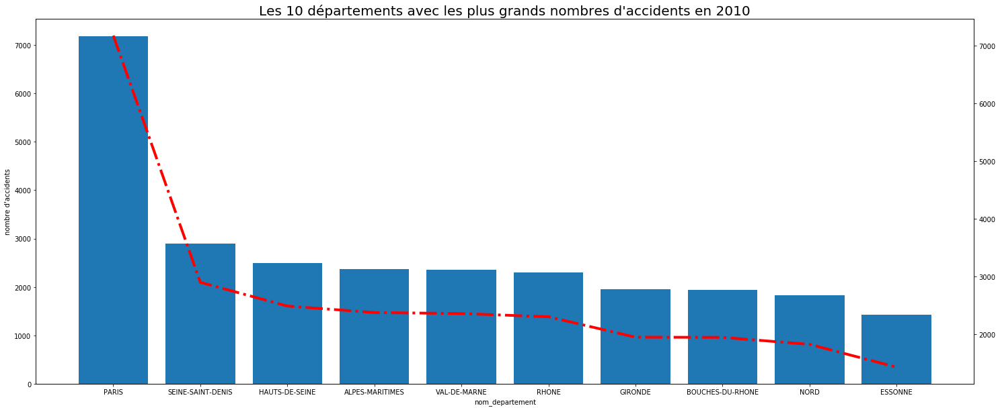

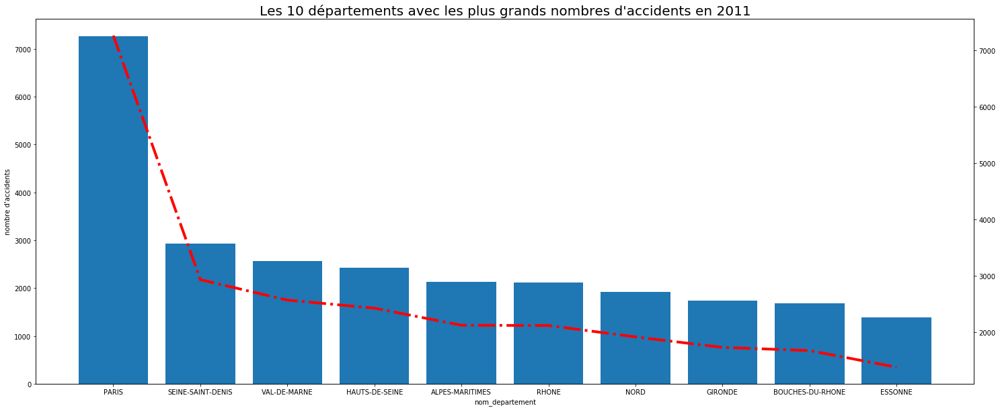

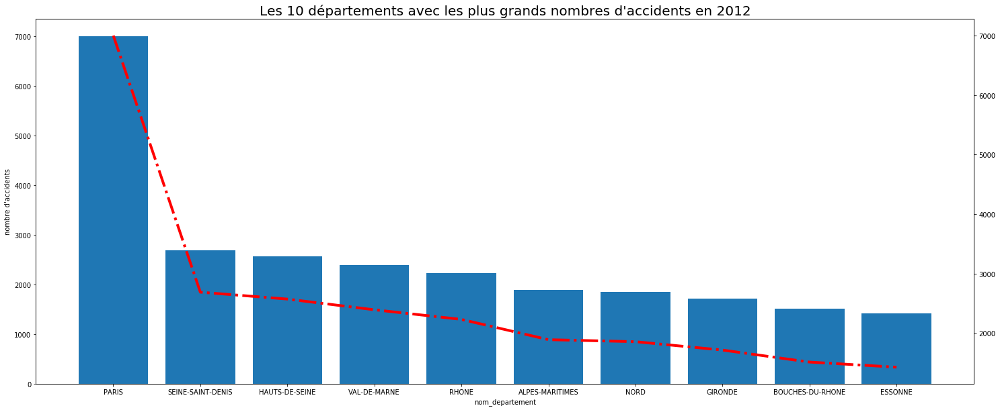

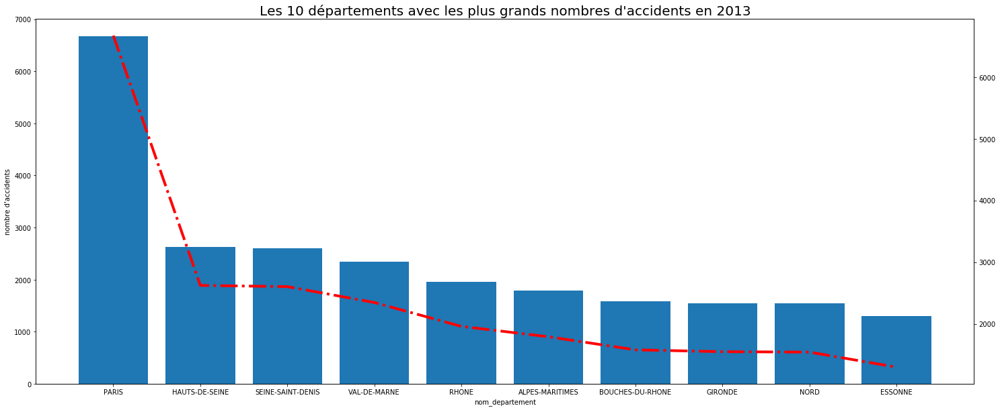

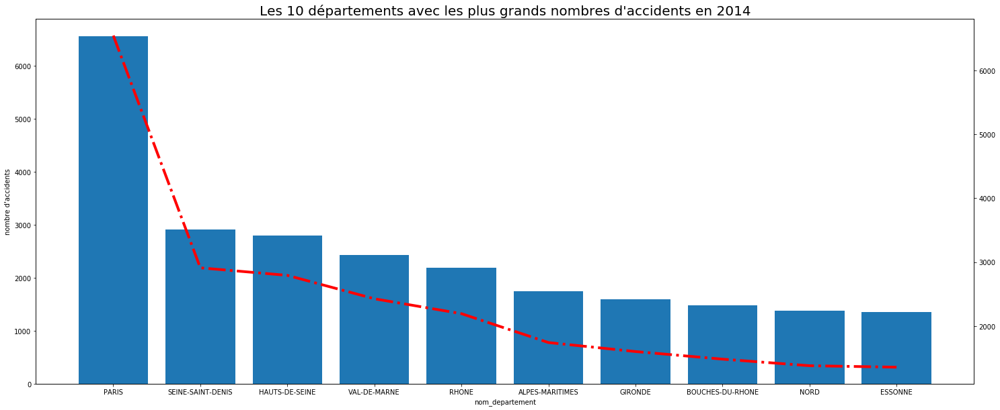

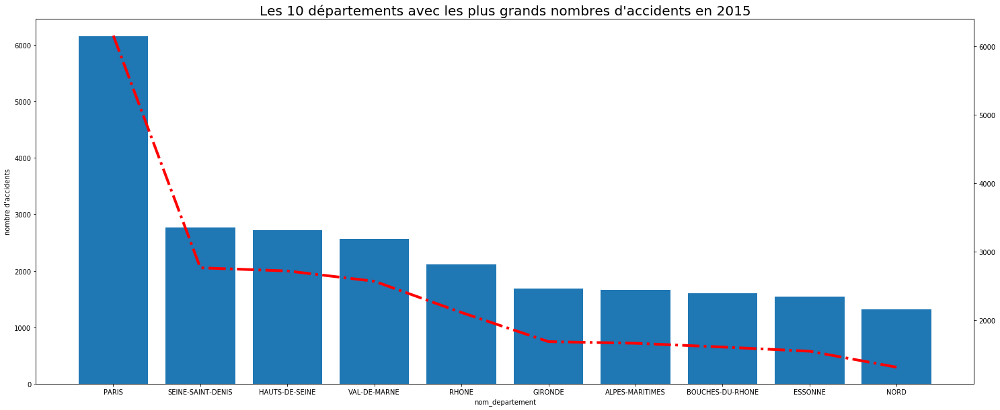

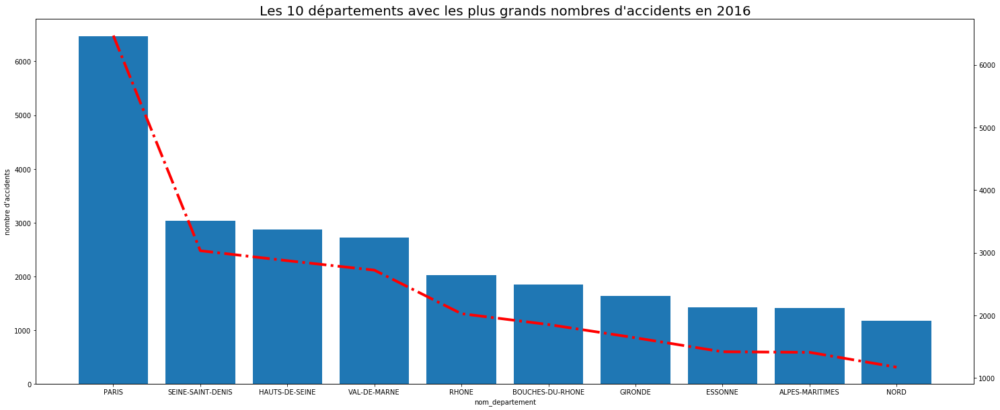

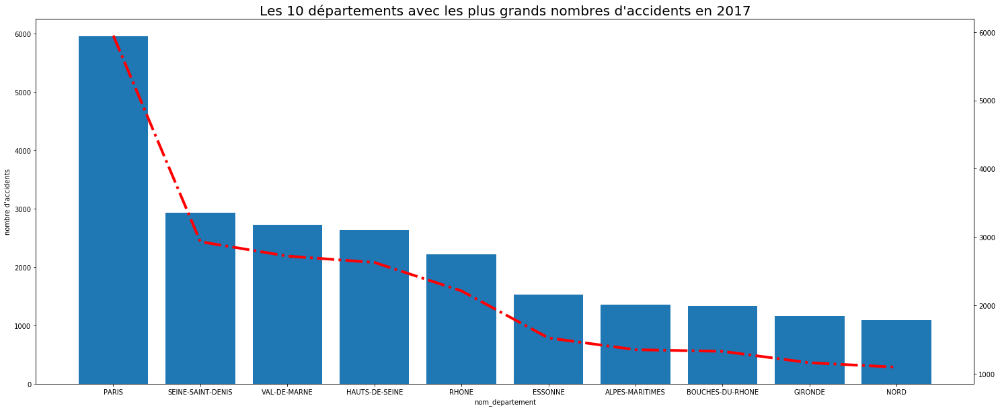

In [4]:
import matplotlib.pyplot as plt
import numpy as np
plt.get_backend()
%matplotlib inline
i = 0
for carac in carac_join:
    plt.figure(figsize=[25,10])
    plt.ylabel("nombre d'accidents")
    plt.bar(x=carac.groupby(by="nom_departement").size().sort_values(ascending=False).keys().tolist()[0:10],
            height=carac.groupby(by="nom_departement").size().sort_values(ascending=False).tolist()[0:10])
    carac.groupby(by="nom_departement").size().sort_values(ascending=False)[0:10].plot(secondary_y=True, color='r', linewidth=4, linestyle="-.")
    plt.title("Les 10 départements avec les plus grands nombres d'accidents en " + str(2010 + i), fontsize=20)
    i = i + 1

On remarque d'après ces visualisations, que cette liste ne change que d'ordre d'une année à une autre, encore, on remarque un motif (pattern) qui est présent dans toutes les visualisations obtenues, dans la droite reliant les hauteurs des départements. Ces deux remarques nous affirment que le département est un des grands facteurs affectant le nombre de sinistres automobiles enregistrées chaque année.
<br><br><center><img src="communes.png"></center><br><br>
Le problème ainsi réside dans la nature de l'information saisie d'après ces 'patterns' trouvés. La 1ère possibilité est que cet ordre n'est qu'un indicateur qualitatif du nombre de communes pour ces départements. Par exemple, si le département de Paris comporte plus de communes que les autres départements avec une grande différence, c'est normal donc de le trouver en tête de la liste obtenue après l'avoir ordonner. Par contre, si on trouve que les communes du département de Paris couvre toute la liste obtenue (ou du moins sa majorité), on peut donc affirmer l'utilité de cette information extraite qui consiste en la relation étroite entre le nombre d'accidents et le département correspondant.

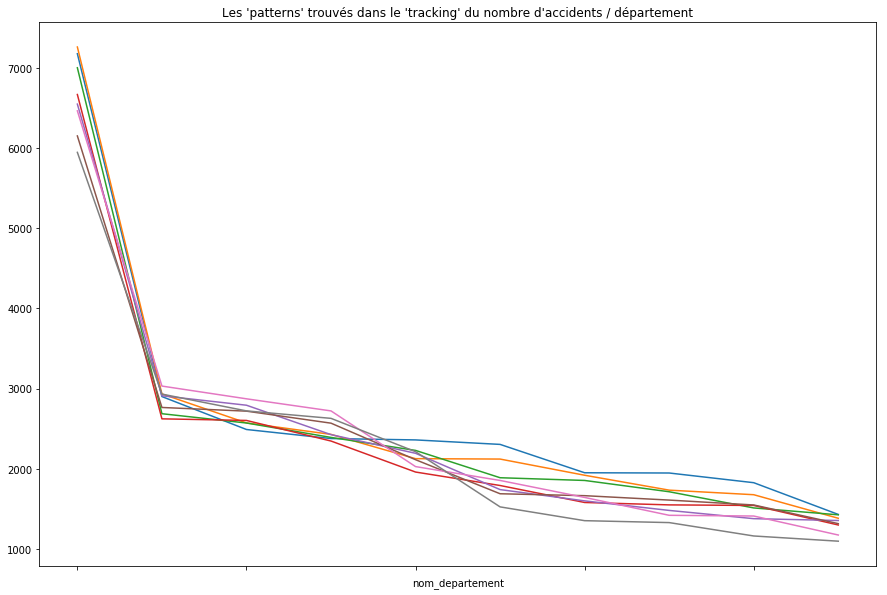

In [5]:
plt.figure(figsize=(15,10))
for carac in carac_join:
    carac.groupby(by="nom_departement").size().sort_values(ascending=False)[0:10].plot()
plt.title("Les 'patterns' trouvés dans le 'tracking' du nombre d'accidents / département");

In [6]:
list_top10carac = []
for carac in carac_join:
     list_top10carac.append(carac.groupby(by="nom_commune").size().sort_values(ascending=False).keys()[0:20])

[set(list_top10carac[0]) & set(list_top10carac[1]) & set(list_top10carac[2])
                & set(list_top10carac[3]) & set(list_top10carac[4]) & set(list_top10carac[5])
                & set(list_top10carac[6]) & set(list_top10carac[7])]

[{'NICE',
  'PARIS-11E-ARRONDISSEMENT',
  'PARIS-12E-ARRONDISSEMENT',
  'PARIS-13E-ARRONDISSEMENT',
  'PARIS-14E-ARRONDISSEMENT',
  'PARIS-15E-ARRONDISSEMENT',
  'PARIS-16E-ARRONDISSEMENT',
  'PARIS-17E-ARRONDISSEMENT',
  'PARIS-18E-ARRONDISSEMENT',
  'PARIS-19E-ARRONDISSEMENT',
  'PARIS-20E-ARRONDISSEMENT',
  'PARIS-8E-ARRONDISSEMENT',
  'RENNES',
  'SAINT-DENIS',
  'TOULOUSE'}]

Voilà donc que l'indépendance de l'apparition de notre motif et le hasard est confirmé: en intersectant les listes des 20 communes renvoyant les plus grands nombres d'accidents, on a trouvé 11 communes appartenant au département de Paris, ce qui a contribué à son classement en tête de liste. Y existe ainsi une grande association entre les départements/communes étudiés et le nombre d'accidents renvoyé.

Essayons donc la même technique avec les communes dans chaque département.

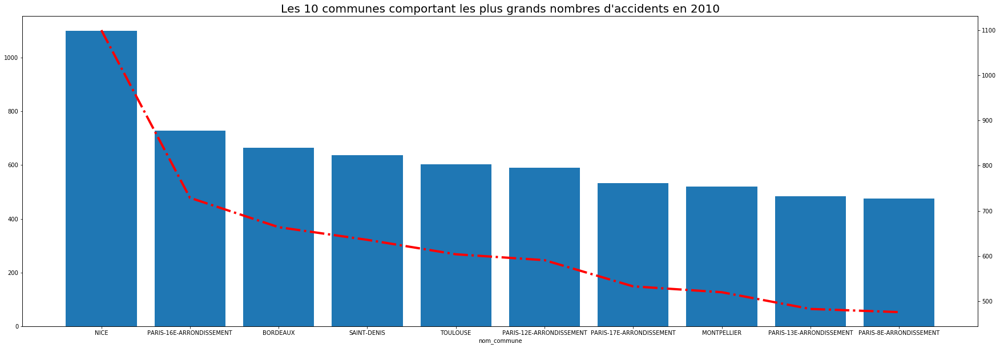

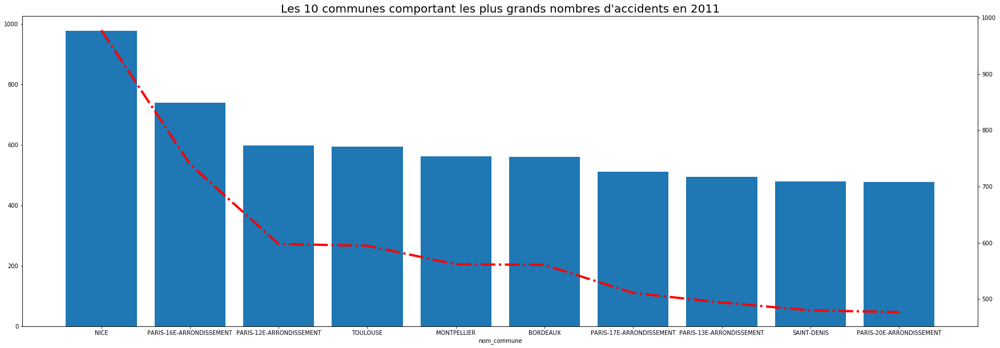

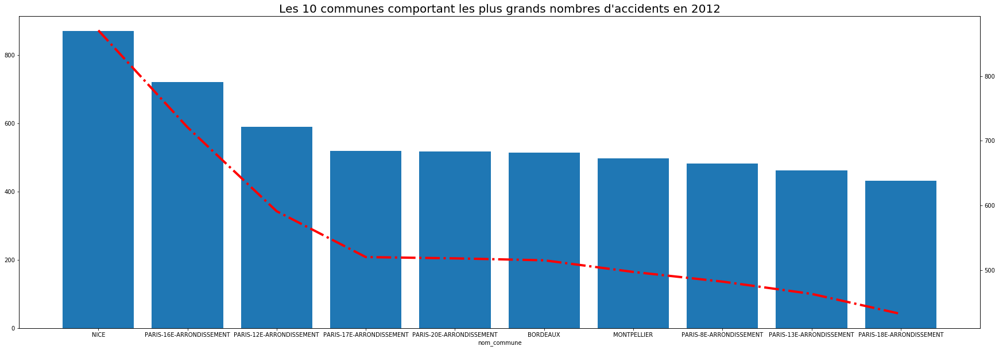

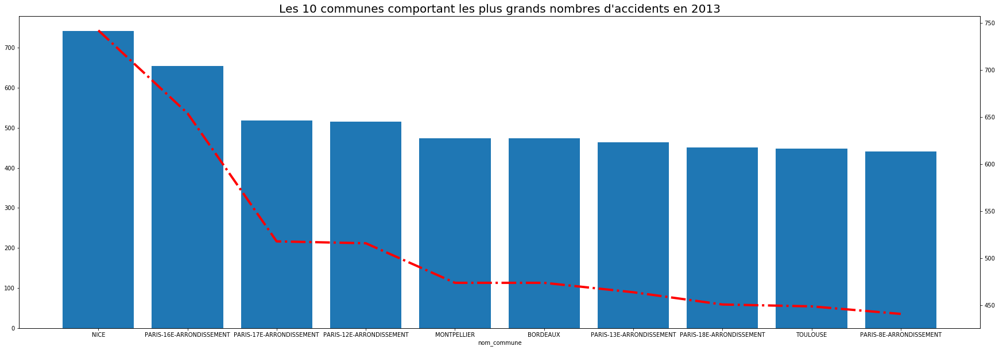

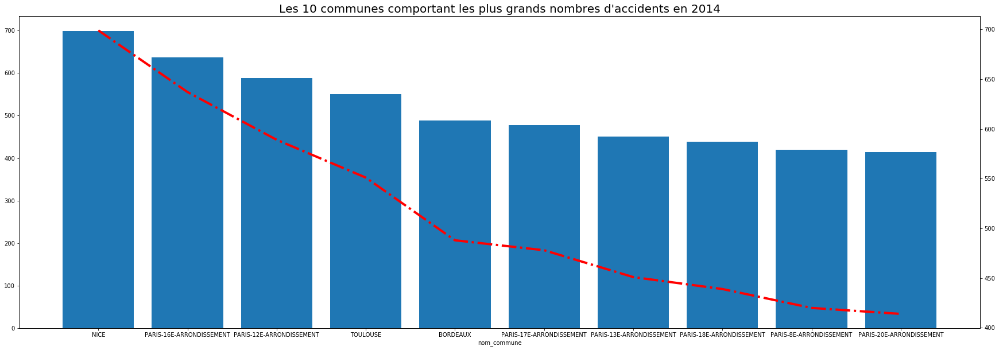

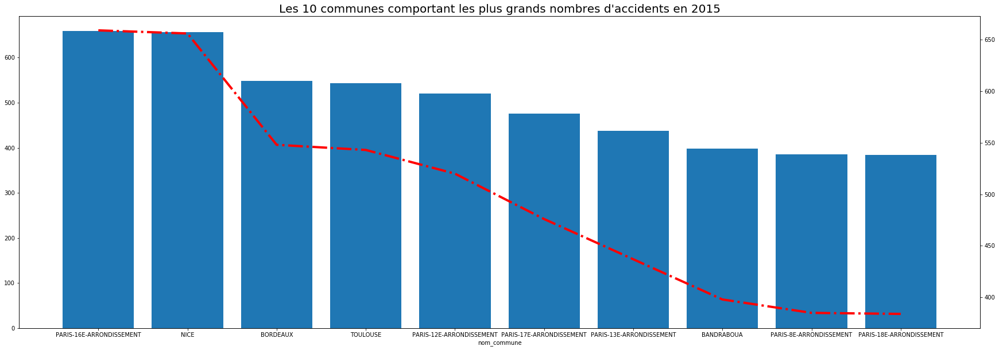

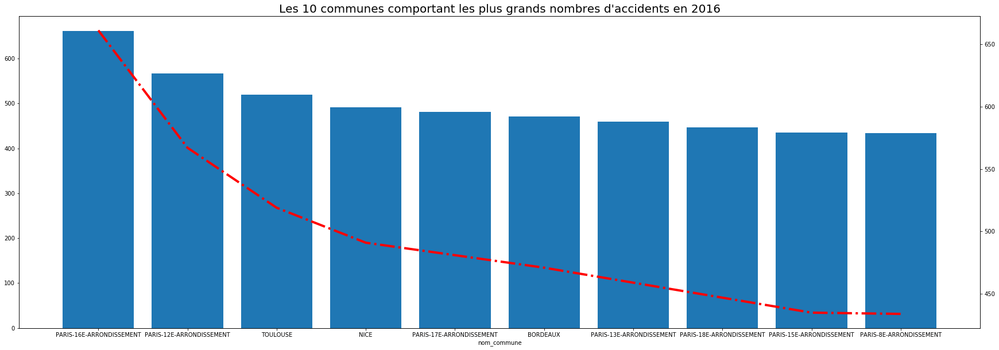

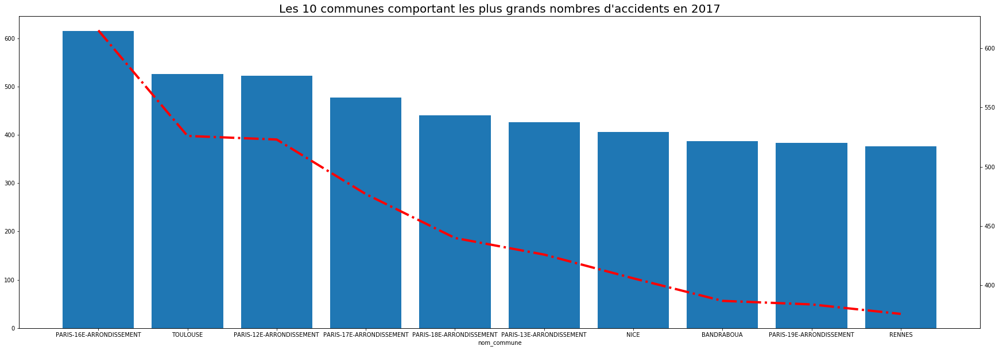

In [7]:
i = 0
for carac in carac_join:
    plt.figure(figsize=[30,10])
    plt.bar(x=carac.groupby(by="nom_commune").size().sort_values(ascending=False).keys().tolist()[0:10],
            height=carac.groupby(by="nom_commune").size().sort_values(ascending=False).tolist()[0:10])
    carac.groupby(by="nom_commune").size().sort_values(ascending=False)[0:10].plot(secondary_y=True, color='r', linestyle="-.", linewidth=4)
    plt.title("Les 10 communes comportant les plus grands nombres d'accidents en " + str(2010 + i), fontsize=20)
    i = i + 1

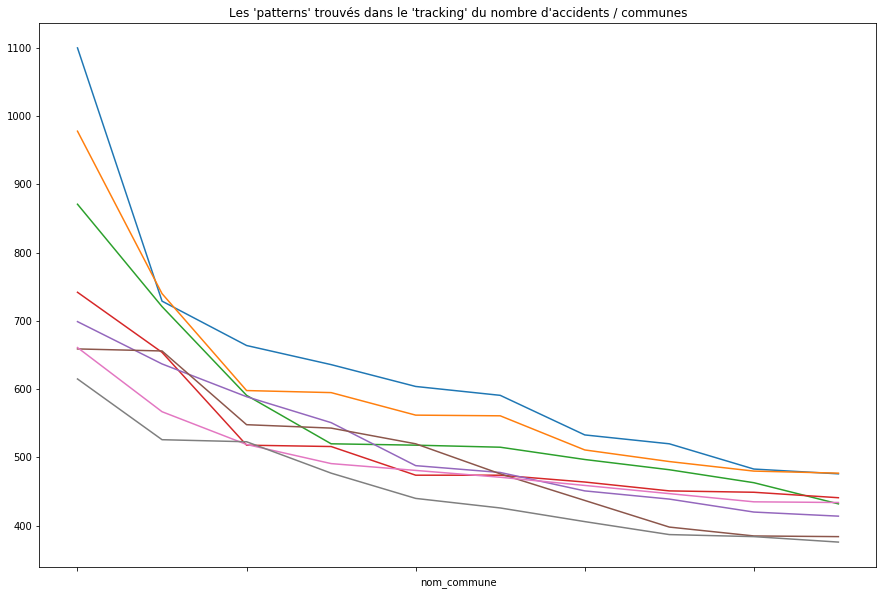

In [8]:
plt.figure(figsize=(15,10))
for carac in carac_join:
    carac.groupby(by="nom_commune").size().sort_values(ascending=False)[0:10].plot()
plt.title("Les 'patterns' trouvés dans le 'tracking' du nombre d'accidents / communes");

Ensuite, pensant des sinistres automobiles, on a tendance parfois de parler de l'état de la météo qui a contribué d'une grande part de l'accident, et ce n'est qu'un lien fourni par notre logique. Pour affirmer cette relation, on a essayé de visualiser l'état de la météo pour chaque accident dans nos données, pour chaque année à part, pour qu'on puisse comparer les années au cas où on remarque une sorte de motif dans les résultats.
<br><br>

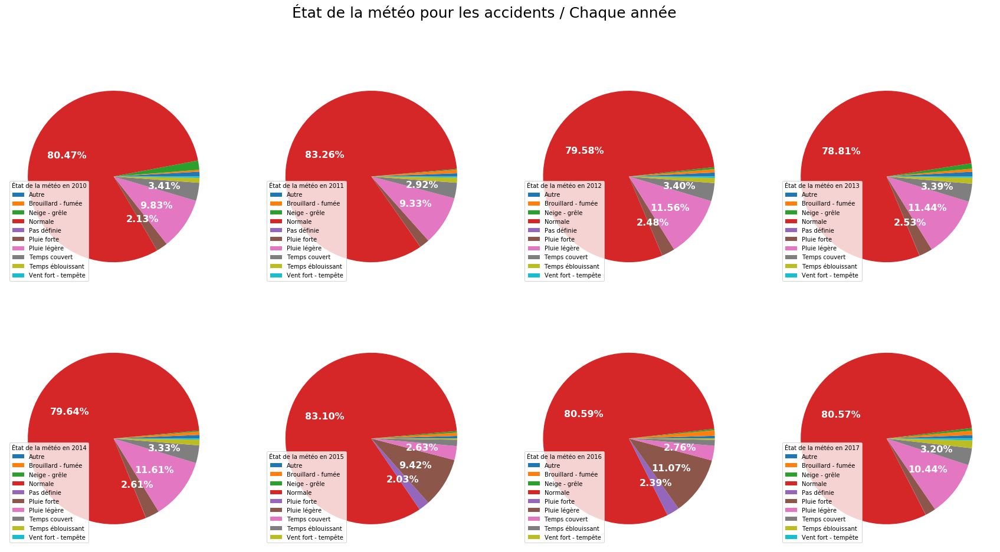

In [9]:
keys = []
vals = []
for carac in carac_list:
    keys.append(carac.groupby(by="meteo").size().keys().tolist())
    vals.append(carac.groupby(by="meteo").size().tolist())

def func(pct):
    return "{:.2f}%".format(pct) if pct > 2 else ''

fig, axs = plt.subplots(2, 4, figsize=(30,15), subplot_kw=dict(aspect="equal"))
fig.suptitle("État de la météo pour les accidents / Chaque année", fontsize=25)
for i in range(0,2):
    for j in range(0,4):        
        wedges, texts, autotexts = axs[i,j].pie(vals[i*4+j],
                                                autopct=lambda pct: func(pct),
                                                textprops=dict(color="w"))
        plt.setp(autotexts, size=16, weight="bold")
        axs[i,j].legend(wedges, keys[i*4+j],
                  title="État de la météo en " + str(2010 + i*4+j),
                  loc="lower left",
                  bbox_to_anchor=(0, 0, 0.5, 1))
plt.show();

<br><br>
Voilà donc qu'après cette visualisation, on peut en conclure que la plupart des accidents sont survenus dans des conditions météorologiques normales. Par contre, ce qu'on peut conclure de cette prédominance de la modalité "Normale", est l'augmentation de la prudence des conducteurs, et même les piétons (et autres intervenants dans les sinistres) durant le mauvais temps.

Prenons maintenant une vision descriptive du reste des données pour une meilleur compréhension du cas d'étude.
<br><br>

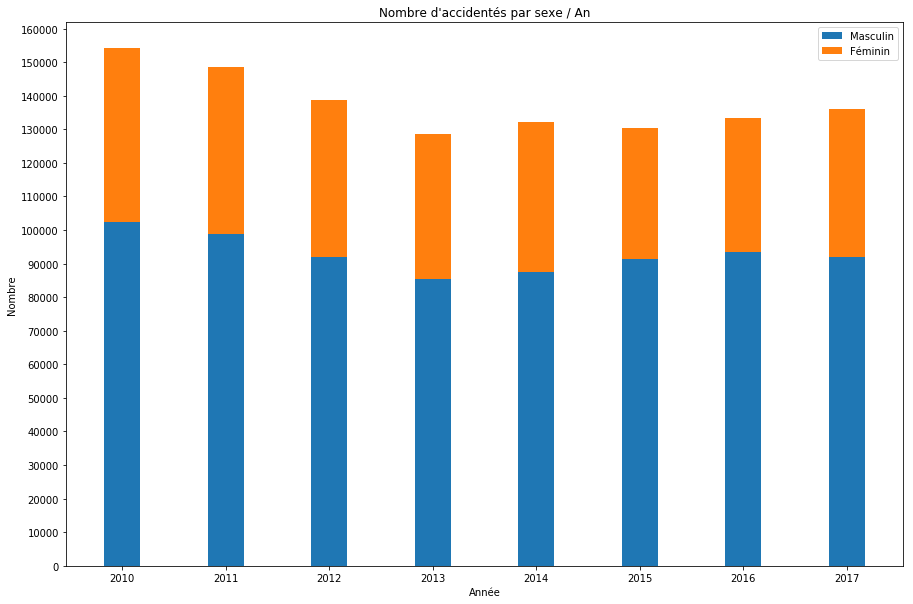

In [10]:
men_vals = []
women_vals = []
for usagers in usagers_list:
    men_vals.append(usagers.groupby(by="sexe").size()['Masculin'])
    women_vals.append(usagers.groupby(by="sexe").size()['Féminin'])

N = 8
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

plt.figure(figsize=(15,10))
p1 = plt.bar(ind, men_vals, width)
p2 = plt.bar(ind, women_vals, width, bottom=men_vals)

plt.ylabel('Nombre')
plt.xlabel('Année')
plt.title("Nombre d'accidentés par sexe / An")
plt.xticks(ind, ('2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017'))
plt.yticks(np.arange(0, 161000, 10000))
plt.legend((p1[0], p2[0]), ('Masculin', 'Féminin'))

plt.show()

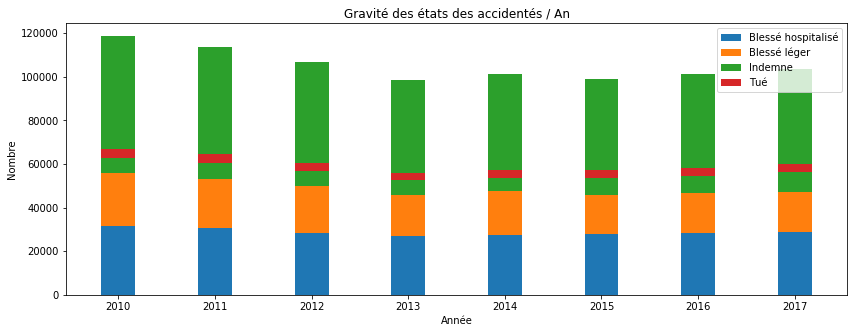

In [11]:
blessehosp_vals = []
blesselegr_vals = []
indemne_vals = []
tue_vals = []
for usagers in usagers_list:
    blessehosp_vals.append(usagers.groupby(by="gravite_etat").size()['Blessé hospitalisé'])
    blesselegr_vals.append(usagers.groupby(by="gravite_etat").size()['Blessé léger'])
    indemne_vals.append(usagers.groupby(by="gravite_etat").size()['Indemne'])
    tue_vals.append(usagers.groupby(by="gravite_etat").size()['Tué'])

N = 8
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

plt.figure(figsize=(14,5))
p1 = plt.bar(ind, blessehosp_vals, width)
p2 = plt.bar(ind, blesselegr_vals, width, bottom=blessehosp_vals)
p3 = plt.bar(ind, indemne_vals, width, bottom=blesselegr_vals)
p4 = plt.bar(ind, tue_vals, width, bottom=indemne_vals)

plt.ylabel('Nombre')
plt.xlabel('Année')
plt.title("Gravité des états des accidentés / An")
plt.xticks(ind, ('2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017'))
plt.yticks(np.arange(0, 121000, 20000))
plt.legend((p1[0], p2[0], p3[0], p4[0]), ("Blessé hospitalisé", "Blessé léger", "Indemne", "Tué"))

plt.show();

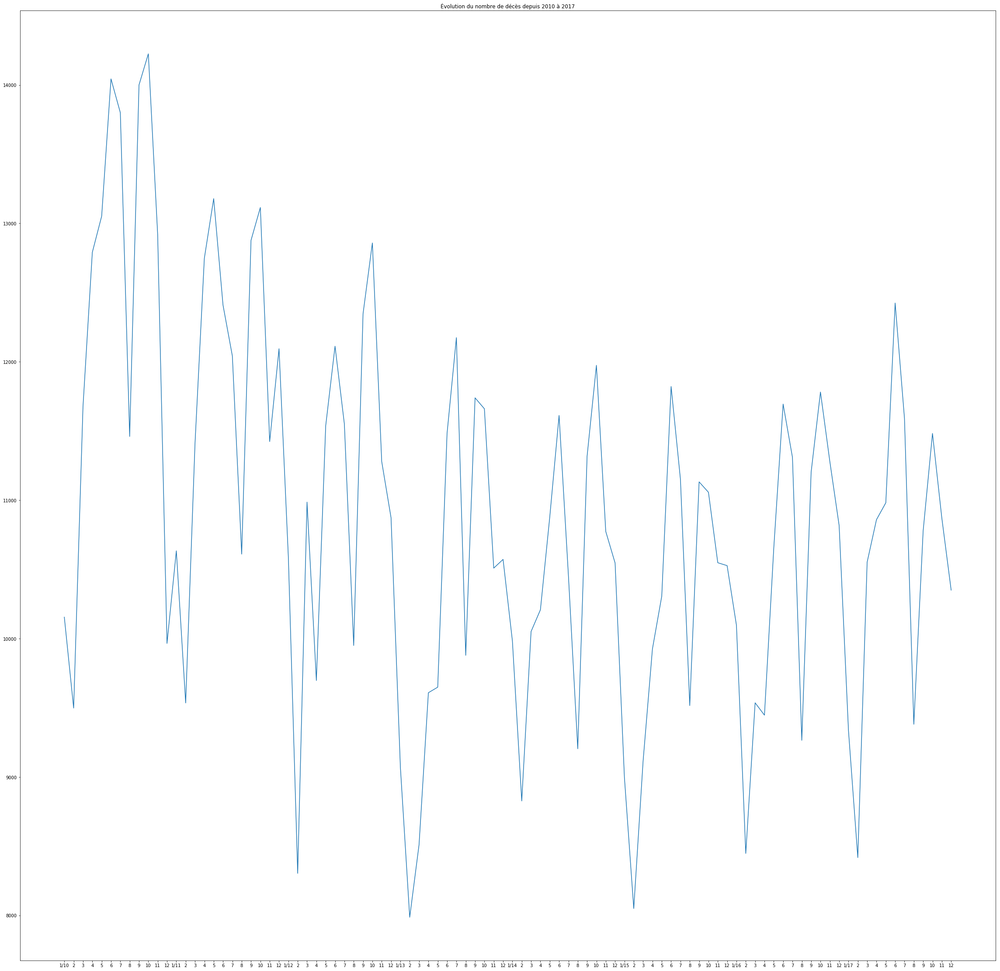

In [366]:
tue_vals = []
for fin in final_join:
    tue_vals.extend(fin.groupby(by="mois").size().reindex(['1', '2', '3', '4', '5', '6',
                                                           '7', '8', '9', '10', '11', '12']).tolist())

df = pd.Series( (v for v in tue_vals) )
plt.figure(figsize=(40,40))
df.plot()
plt.title("Évolution du nombre de décès depuis 2010 à 2017")
N = 96
ind = np.arange(N)    # the x locations for the groups
plt.xticks(ind, ('1/10','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/11','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/12','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/13','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/14','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/15','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/16','2','3','4','5','6',
                 '7','8','9','10','11','12',
                 '1/17','2','3','4','5','6',
                 '7','8','9','10','11','12'));

<br><h2>Modélisation et évaluation de l'information extraite</h2><br>
Après avoir attaqué la visualisation et l'analyse des données dont on dispose, on passe à la modélisation, biensûr sans arrêter le "feature engineering" pour une extraction de toute information utile à notre étude. Commencons donc par appliquer quelques tests statistiques pour mieux évaluer notre population et nos échantillons dans les bases de données fournies.
<br>

In [4]:
classification_join = final_join[0]
for i in range(1,8):
    classification_join = classification_join.append(final_join[i], ignore_index=True)

classification_join.heure_min = classification_join.heure_min.apply(lambda x : int(x[0:2]) * 60 + int(x[3:5]))
classification_join.drop(columns=['num_acc', 'an', 'num_veh'], axis=1, inplace=True)
categorical_data = classification_join.drop(columns=['largeur_tpc',
                                                     'largeur_route', 'nom_departement', 'nom_commune',
                                                     'mois', 'jour', 'heure_min', 'numero_route',
                                                     'nbre_voies', 'an_nais', 'proximite_ecole', 'insee'], axis=1)
classification_join = classification_join[['largeur_tpc', 'largeur_route', 'mois', 'jour', 'heure_min',
                                           'numero_route', 'nbre_voies', 'an_nais', 'proximite_ecole', 'insee']]
import re
def switch_base_ifneeded(x):
    try:
        return int(str(x))
    except:
        return int(re.compile('[^A-Z0-9]').sub('', str(x).upper()), 36)

for colum in classification_join.columns.values.tolist():
    classification_join[colum] = classification_join[colum].apply(lambda x : switch_base_ifneeded(x))

for column in categorical_data.columns.values.tolist():
    classification_join = pd.concat([classification_join,
                                     pd.get_dummies(categorical_data[column]).drop(['Pas définie'],
                                                                                   axis=1,
                                                                                  errors='ignore')], axis=1)

Après une nouvelle inspection des données en s'intéressant au typage et encodage pour la modélisation, il s'est avéré qu'on dispose de différents types de données incompatibles. Pour résoudre ce problème, on a essayé de recoder les données pour les normaliser et ainsi pouvoir procèder à la modélisation. Une des colonnes où se manifeste ce problème, la colonne 'numero_route' qui nous renseigne sur la référence ou le numéro de la route dans cette commune; un identifiant dont on se serve pour caractériser une route unique sur la carte routière francaise.
<center><img src="numero_route.jpg"></center>
Notre problème avec cette colonne est qu'elle présente des identifiants composées en caractères alphanumériques hormis d'autres symboles non-alphanumériques comme le '.' ou le simple espace '&nbsp;&nbsp;'.
C'est pourquoi qu'on a eu recours à la base numérique 36 (26 caractères alphabétiques + 10 caractères numériques) avec l'élimination des caractères spéciaux (après vérification de la non-induction de duplications dans les données). On a ainsi obtenu, après le 'dummy coding', des nouveaux identifiants numériques (seulement) pour la caractérisation cartographique des routes.

<small><i>NB* On a supprimé les colonnes concernant les modalités 'Pas définie' pour toute variable catégorique, vu qu'on peut déduire sa valeur par élimination en n'utilisant que les autres modalités disponibles.</i></small>
<br><br>

In [14]:
classification_join.head(10)

,largeur_tpc,largeur_route,mois,jour,heure_min,numero_route,nbre_voies,an_nais,proximite_ecole,insee,...,Sur refuge ou BAU,Sur trottoir,Autre,Avec animal,Jouant - courant,Masqué,Sens inverse du véhicule,Sens véhicule heurtant,Traversant,non renseigné ou sans objet
0,0,60,6,12,1170,39,2,1976,0,59052,...,0,0,0,0,0,0,0,0,0,1
1,0,0,10,25,735,239,1,1990,99,59052,...,0,0,0,0,0,0,0,0,0,1
2,0,0,10,25,735,239,1,1959,99,59052,...,0,0,0,0,0,0,0,0,0,1
3,0,0,8,7,600,39,0,1983,0,59477,...,0,0,0,0,0,0,0,0,0,1
4,0,0,8,7,600,39,0,1965,0,59477,...,0,0,0,0,0,0,0,0,1,0
5,0,68,9,22,990,39,2,1996,0,59477,...,0,0,0,0,0,0,0,0,0,1
6,0,68,9,22,990,39,2,1963,0,59477,...,0,0,0,0,0,0,0,0,0,1
7,0,61,9,11,960,41,2,1979,0,59011,...,0,0,0,0,0,0,0,0,0,1
8,0,61,9,11,960,41,2,1959,0,59011,...,0,0,0,0,0,0,0,0,0,1
9,0,61,9,11,960,41,2,1970,0,59011,...,0,0,0,0,0,0,0,0,0,1


In [15]:
classification_join.describe()

,largeur_tpc,largeur_route,mois,jour,heure_min,numero_route,nbre_voies,an_nais,proximite_ecole,insee,...,Sur refuge ou BAU,Sur trottoir,Autre,Avec animal,Jouant - courant,Masqué,Sens inverse du véhicule,Sens véhicule heurtant,Traversant,non renseigné ou sans objet
count,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,...,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06,1.045194e+06
mean,5.641176e+00,5.375683e+01,6.686027e+00,1.560310e+01,8.437741e+02,6.615781e+02,2.077889e+00,1.974724e+03,4.759931e+01,5.908081e+04,...,9.376250e-05,5.412392e-03,5.959659e-03,2.066602e-04,5.428657e-03,1.745131e-03,2.351717e-03,4.944537e-03,6.431151e-02,9.138964e-01
std,2.412411e+01,6.565795e+01,3.377152e+00,8.751258e+00,3.211605e+02,1.323934e+05,1.281865e+00,3.628539e+01,4.933174e+01,2.841631e+04,...,9.682654e-03,7.336964e-02,7.696848e-02,1.437420e-02,7.347920e-02,4.173831e-02,4.843747e-02,7.014337e-02,2.453071e-01,2.805172e-01
min,-1.000000e+00,-1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,1.001000e+03,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00,4.000000e+00,8.000000e+00,6.050000e+02,0.000000e+00,2.000000e+00,1.963000e+03,0.000000e+00,3.414300e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
50%,0.000000e+00,5.500000e+01,7.000000e+00,1.600000e+01,9.000000e+02,0.000000e+00,2.000000e+00,1.978000e+03,3.000000e+00,6.714000e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
75%,0.000000e+00,7.600000e+01,1.000000e+01,2.300000e+01,1.090000e+03,7.500000e+01,2.000000e+00,1.990000e+03,9.900000e+01,8.306200e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
max,9.500000e+02,9.990000e+02,1.200000e+01,3.100000e+01,1.439000e+03,4.596682e+07,1.300000e+01,2.017000e+03,9.900000e+01,9.761700e+04,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


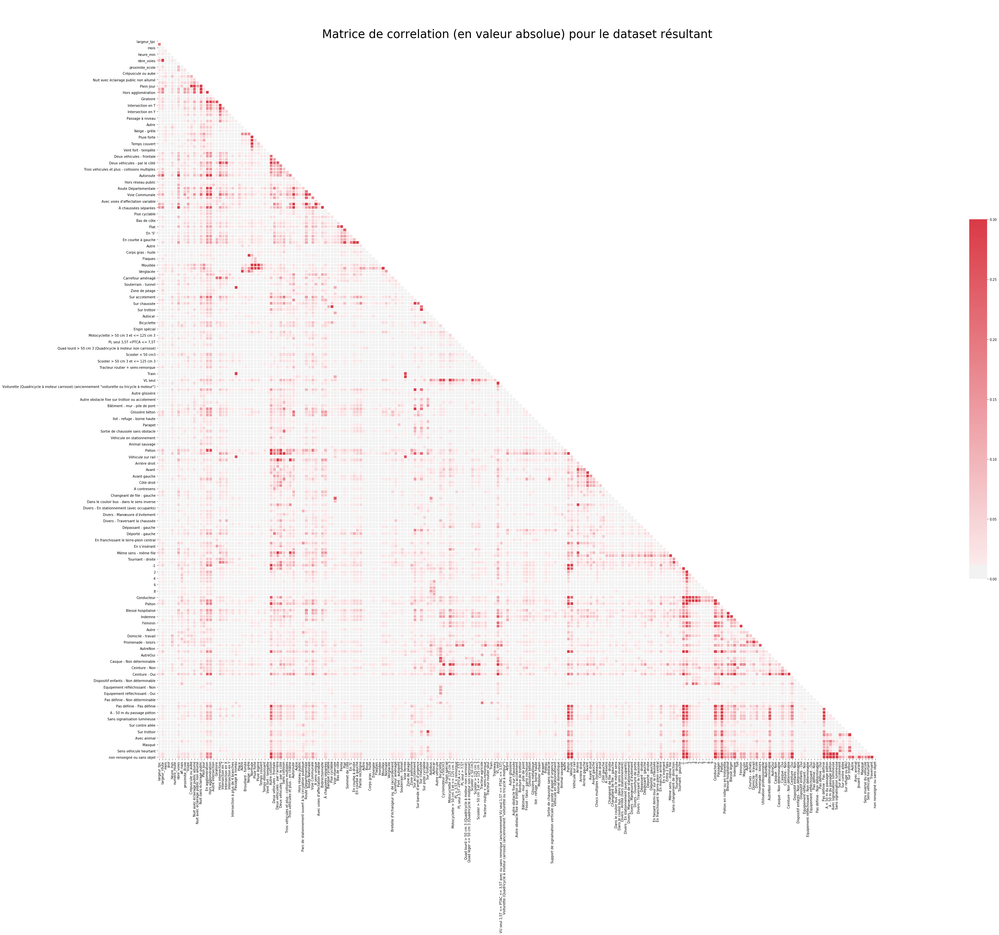

In [6]:
import seaborn as sns

# Compute the correlation matrix
corr = classification_join.corr().abs()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(100, 40))
plt.title("\n\nMatrice de correlation (en valeur absolue) pour le dataset résultant", fontsize=35)

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

<br><br>
En analysant cette visualisation de la matrice de corrélation, on peut observer que l'indice de corrélation (en valeur absolue) ne dépasse jamais la valeur 0,3; ce qui se dénonce insuffisant pour éliminer encore des colonnes ou pour considérer les variables qu'elles représentent corrélées. On remarque donc qu'on est arrivé à la fin de l'étape du "Feature Engineering". Notre dataset résultant porte autant d'information utile à notre modélisation et aux analyses effectuées, on peut donc s'attaquer à la modélisation. Le premier modèle qu'on essaiera de créer est un modèle de prédiction par classification du décès des accidentés. Notre dernier pas avant d'entammer la création de ce modèle, sera donc de lui choisir la bonne variable cible à estimer.

In [265]:
pd.DataFrame(classification_join.groupby("Tué").size(), columns=["Effectif sélectionné"])

,Effectif sélectionné
Tué,
0,1015948
1,29246


On peut remarquer notre position défavorable dans ce déséquilibre, en terme d'effectif pour chaque modalité de la variable cible. On essaiera donc de sélectionner une autre variable cible qui favorise l'équilibre du dataset, en plus de ca, ce qu'on essaiera de faire, est d'utiliser des algorithmes de bagging pour notre modélisation, pour qu'on évite les effets reliés à ce déséquilibre.

In [266]:
pd.DataFrame(classification_join.groupby("Indemne").size(), columns=["Effectif sélectionné"])

,Effectif sélectionné
Indemne,
0,617665
1,427529


Cette variable est donc celle qu'on choisira comme cible pour notre modélisation, vu que c'est la meilleur en terme de partitionnement de la population présente.

In [379]:
classification_join.drop(['Tué', 'Blessé hospitalisé', 'Blessé léger', 'Tournant - droite',
                          'Equipement réfléchissant - Oui', 'Pas définie - Non déterminable',
                          'Ceinture - Non', 'Casque - Non'], axis=1, errors='ignore', inplace=True)

# Labels are the values we want to predict
labels = np.array(classification_join['Indemne'])

# Remove the labels from the features
# axis 1 refers to the columns
features = classification_join.drop('Indemne', axis = 1)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to numpy array
features = np.array(features)

# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, labels,
                                                                            test_size = 0.25, random_state = 49)

print('Variables de training', train_features.shape)
print('Variable cible de training:', train_labels.shape)
print('Variable de test:', test_features.shape)
print('Variable cible de test:', test_labels.shape)

Variables de training (783895, 216)
Variable cible de training: (783895,)
Variable de test: (261299, 216)
Variable cible de test: (261299,)


In [334]:
# Import the model we are using
from sklearn.ensemble import RandomForestClassifier

# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 1000, random_state=49)

# Train the model on training data
rf.fit(train_features, train_labels);

# Use the forest's predict method on the test data
predictions = rf.predict(test_features)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy: {:.2f}%".format(metrics.accuracy_score(test_labels, predictions)*100))

# Feature Importances
feature_imp = pd.Series(rf.feature_importances_,index=feature_list).sort_values(ascending=False)

Accuracy: 79.00%


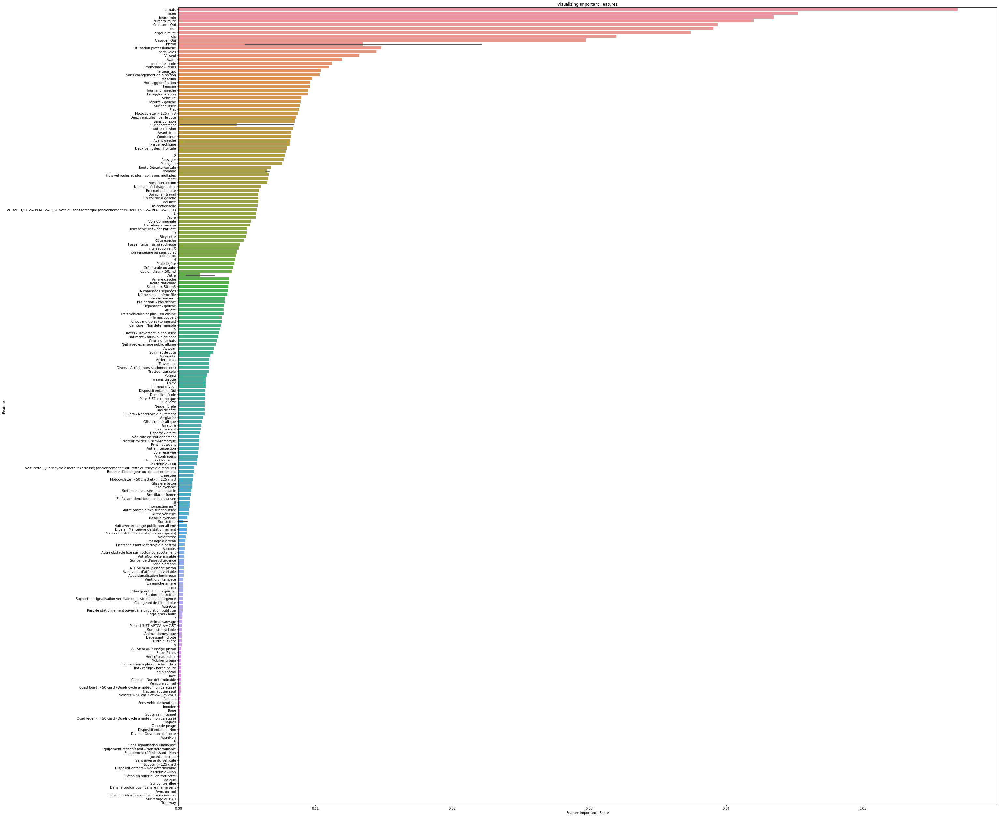

In [303]:
# Creating a bar plot
plt.figure(figsize=(45,45))
sns.barplot(x=feature_imp, y=feature_imp.index)

# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show();

Si on considère ce qu'a dégagé notre visualisation depuis notre modèle, on peut voir qu'il n'a pas vraiment tord, et que les liens, qu'il a effectué selon sa propre pondération d'importance, entre les variables et le résultat prédit sont tout à fait logiques. Pour prévoir si une personne accidentée est morte/indemne, il faut d'abord identifier son age (d'où la grande importance de l'année de naissance et la date), les conditions de la route (code_insee, num_route, nbre_voies, ..) et beaucoup d'autres facteurs (biensûr sans omettre celles qu'on peut pas identifier leurs liens logiques avec la mort de l'accidentée mais que notre modèle a marqué importantes).
Et pour se déclarer gagnants par notre feature engineering, ce qu'on a essayé de faire pour l'identification des variables 'code_insee' et 'num_route' a donné résultat, déjà elles font partie des variables les plus importantes par notre modèle.

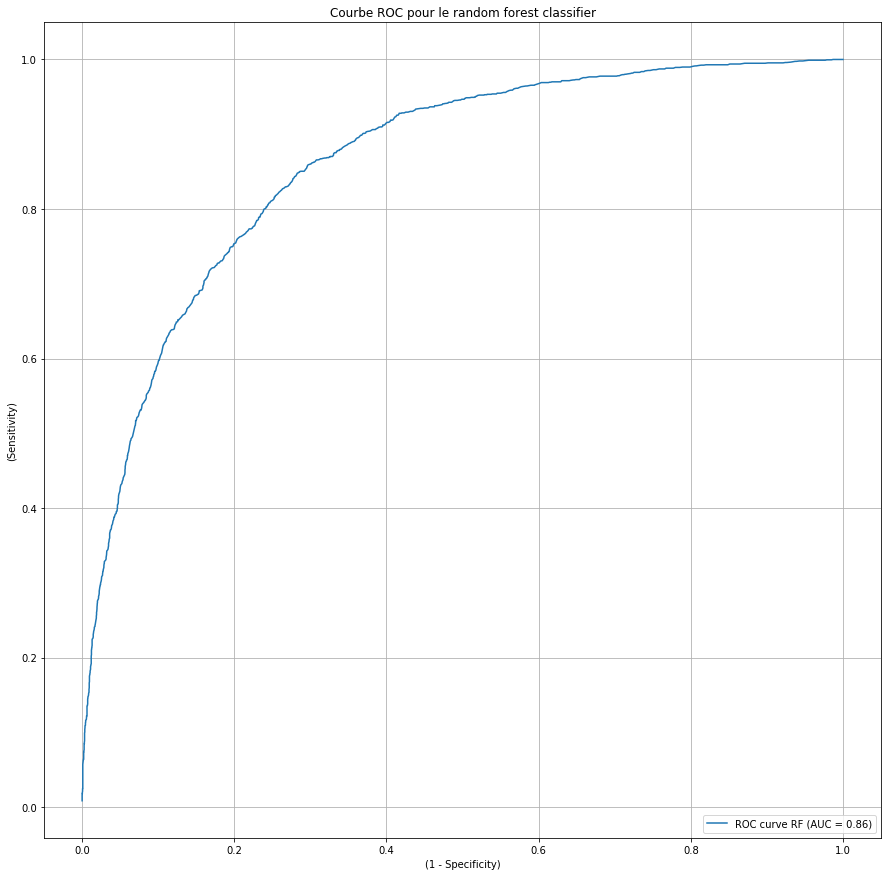

In [304]:
from sklearn.metrics import roc_curve, auc
plt.figure(figsize=(15,15))
rf_pred_prob = rf.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, rf_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve RF (AUC = %0.2f)' % roc_auc)
plt.title("Courbe ROC pour le random forest classifier")
plt.xlabel('(1 - Specificity)')
plt.ylabel('(Sensitivity)')
plt.grid(True)
plt.legend(loc="lower right")
plt.show()

In [305]:
import lightgbm as lgm
lgbm = lgm.LGBMClassifier(objective='binary', class_weight='balanced')
lgbm.fit(train_features, train_labels);
predictions = lgbm.predict(test_features)

print("Accuracy: {:.2f}%".format(metrics.accuracy_score(test_labels, predictions)*100));

Accuracy: 76.93%


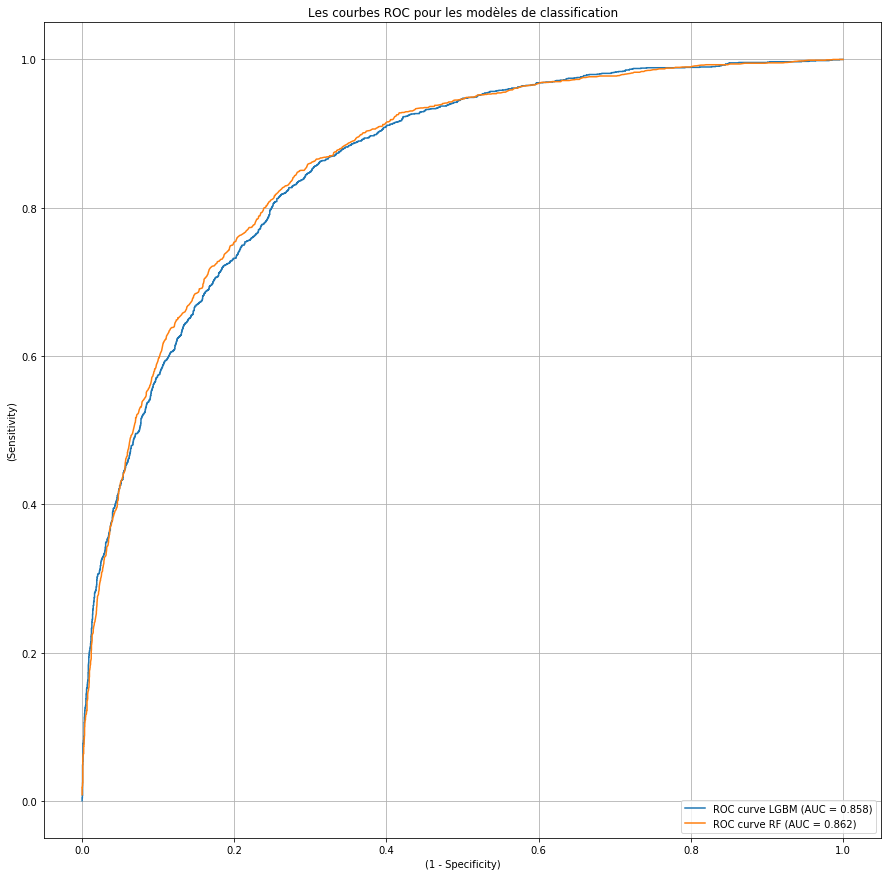

In [306]:
plt.figure(figsize=(15,15))
lgbm_pred_prob = lgbm.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, lgbm_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve LGBM (AUC = %0.3f)' % roc_auc)
rf_pred_prob = rf.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, rf_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve RF (AUC = %0.3f)' % roc_auc)
plt.title("Les courbes ROC pour les modèles de classification")
plt.xlabel('(1 - Specificity)')
plt.ylabel('(Sensitivity)')
plt.grid(True)
plt.legend(loc="lower right")
plt.show()

In [307]:
from sklearn.ensemble import AdaBoostClassifier
ab = AdaBoostClassifier()
ab.fit(train_features, train_labels);
predictions = ab.predict(test_features)
print("Accuracy: {:.2f}%".format(metrics.accuracy_score(test_labels, predictions)*100))

Accuracy: 75.91%


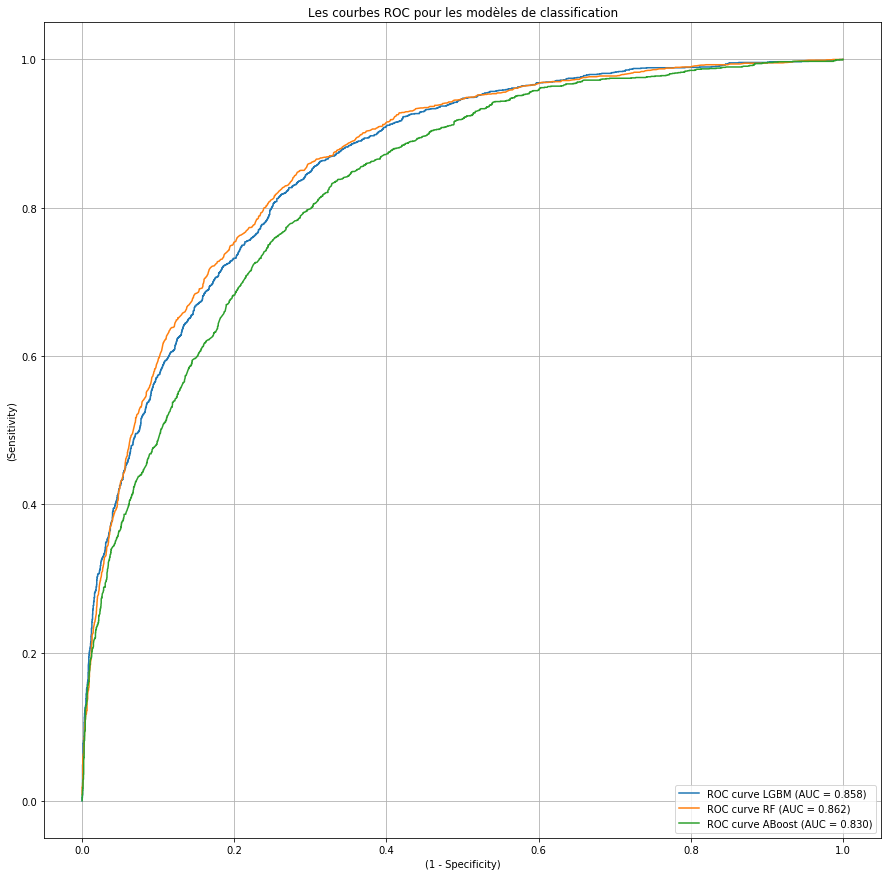

In [308]:
plt.figure(figsize=(15,15))
lgbm_pred_prob = lgbm.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, lgbm_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve LGBM (AUC = %0.3f)' % roc_auc)
rf_pred_prob = rf.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, rf_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve RF (AUC = %0.3f)' % roc_auc)
ab_pred_prob = ab.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, ab_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve ABoost (AUC = %0.3f)' % roc_auc)
plt.title("Les courbes ROC pour les modèles de classification")
plt.xlabel('(1 - Specificity)')
plt.ylabel('(Sensitivity)')
plt.grid(True)
plt.legend(loc="lower right")
plt.show()

In [309]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier()
gb.fit(train_features, train_labels);
predictions = gb.predict(test_features)
print("Accuracy: {:.2f}%".format(metrics.accuracy_score(test_labels, predictions)*100))

Accuracy: 76.24%


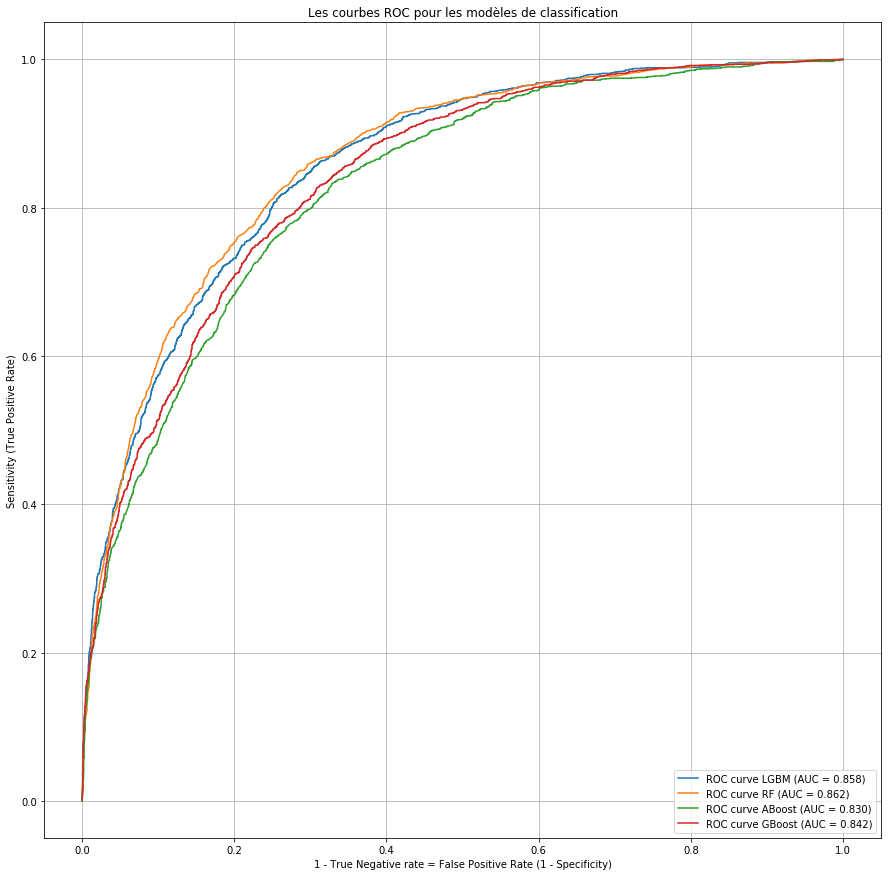

In [310]:
plt.figure(figsize=(15,15))
lgbm_pred_prob = lgbm.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, lgbm_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve LGBM (AUC = %0.3f)' % roc_auc)
rf_pred_prob = rf.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, rf_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve RF (AUC = %0.3f)' % roc_auc)
ab_pred_prob = ab.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, ab_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve ABoost (AUC = %0.3f)' % roc_auc)
gb_pred_prob = gb.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, gb_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve GBoost (AUC = %0.3f)' % roc_auc)
plt.title("Les courbes ROC pour les modèles de classification")
plt.xlabel('1 - True Negative rate = False Positive Rate (1 - Specificity)')
plt.ylabel('Sensitivity (True Positive Rate)')
plt.grid(True)
plt.legend(loc="lower right")
plt.show()

Après tout test et modélisation effectuée, on est sûr ainsi qu'on essaiera de prendre comme pseudo solution, le modèle issue par le forêt aléatoire. Et suite à sa courbe ROC associée, ce qu'on essaiera de faire, est de minimiser le taux des faux positives vu que notre variable cible est la modalité "Indemne". C'est évident donc qu'on essaiera de minimiser le taux des faux positives: Induire en des fausses alertes de morts en accidents est mieux qu'induire des fausses alertes d'indemnité en cas d'accident.

In [311]:
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 1000,
 'n_jobs': 1,
 'oob_score': False,
 'random_state': 49,
 'verbose': 0,
 'warm_start': False}


Les paramètres utilisées par notre modèle jusqu'à présent (le forêt aléatoire)
- <strong>n_estimators</strong> = Nombre des arbres dans le forêt aléatoire

- <strong>max_features</strong> = Nombre maximal de variables (features) considérées pour le fractionnement d'un noeud

- <strong>max_depth</strong> = Nombre maximal de niveaux dans chaque arbre

- <strong>min_samples_split</strong> = Nombre minimal des points de données (observations/lignes) placés dans un noeud avant le fractionnement

- <strong>min_samples_leaf</strong> = Nombre minimal des observations permises dans un noeud feuille (noeud terminal)

- <strong>bootstrap</strong> = Méthode d'échantillonage des observations / points des données (avec/sans remplacement)

In [312]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [325]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3,
                               verbose=False, random_state=49, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_features, train_labels)
rf_random.best_params_

{'n_estimators': 1200,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': False}

In [330]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    accuracy = metrics.accuracy_score(test_labels, predictions)*100
    print("Accuracy: {:.2f}%".format(metrics.accuracy_score(test_labels, predictions)*100))
    return accuracy

base_model = RandomForestClassifier(n_estimators = 1000, random_state = 49)
base_model.fit(train_features, train_labels)
print('Base Model Performance')
base_accuracy = evaluate(base_model, test_features, test_labels)
print('Boosted Model Performance')
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, test_features, test_labels)

print('Improvement of {:0.2f}%.'.format(100 * (random_accuracy - base_accuracy) / base_accuracy))

Base Model Performance
Accuracy: 79.00%
Boosted Model Performance
Accuracy: 78.93%
Improvement of -0.09%.


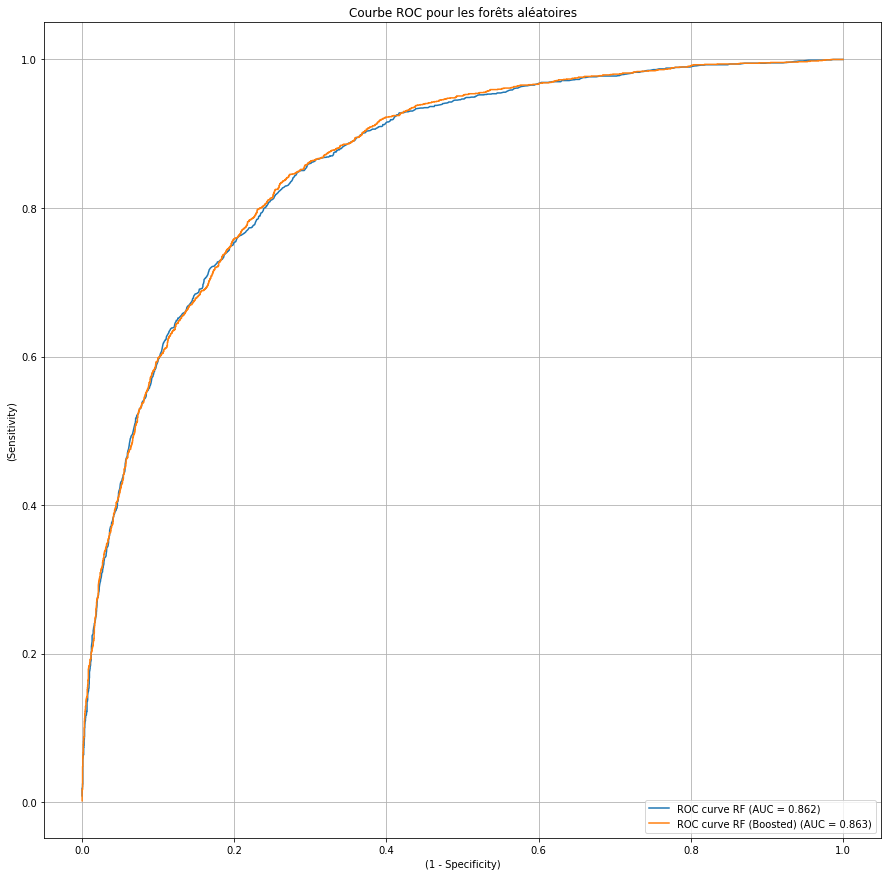

In [336]:
plt.figure(figsize=(15,15))
rf_pred_prob = rf.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, rf_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve RF (AUC = %0.3f)' % roc_auc)
rfrn_pred_prob = best_random.predict_proba(test_features)[:, 1]
fpr, tpr, thresholds = roc_curve(test_labels, rfrn_pred_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,label='ROC curve RF (Boosted) (AUC = %0.3f)' % roc_auc)
plt.title("Courbe ROC pour les forêts aléatoires")
plt.xlabel('(1 - Specificity)')
plt.ylabel('(Sensitivity)')
plt.grid(True)
plt.legend(loc="lower right")
plt.show()

Voilà donc qu'en essayant de renforcer notre modèle, on a diminué malheureusement sa précision par 0.09% mais par contre, on a augmenté l'AUC par 0.1%, ce qui n'est pas surprenant, mais toujours considérable vu qu'on est entrain de traiter un problème lié à l'appel de l'assistance médicale en cas d'alerte d'accident. (Selon la moyenne de ces 8 années étudiées, 0.1% correspond à 4 personnes sauvés de plus).

Après ces tentatives de renforcement de notre modèle, il est temps de l'exporter pour l'utiliser dans <strong>notre application en déploiement</strong> et passer vers notre deuxième modélisation.

In [374]:
import pickle
# save the model to disk
filename = 'indemnite_classification_model.sav'
pickle.dump(best_random, open(filename, 'wb'))
# some time later...
# load the model from disk
# loaded_model = pickle.load(open(filename, 'rb'))
# result = loaded_model.score(X_test, Y_test)

Passons maintenant à la deuxième modélisation, où on essaiera de prévoir le nombre d'accidents par commune et/ou par département.

Dans cette partie, vu que le temps est le plus important des facteurs étudiés, on se retrouve obligés de mener une étude temporelle du sujet, c'est pourquoi qu'on sera amené à modéliser le problème sous la forme d'une série temporelle.

In [35]:
sns.set()
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from copy import deepcopy
from datetime import datetime
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=False)

# Functions we'll find useful in our analysis:

"""Plots a simple serie in PLOTLY."""
def jsplot(dates , values , mode = 'lines+markers'):

    data = [go.Scatter(
              x=dates,
              y=values,
              mode = mode)]

    iplot(data)
    
    
"""Plot multiple series in PLOTLY:"""
def jsplot_multiple(dates , values , title, mode = 'lines+markers'):

    data = []
    for col in values.columns:
        splot = go.Scatter(
                        x=dates,
                        y=values[col],
                        mode = mode,
                        name = str(col) )
        data.append(splot)
    layout = go.Layout(title=title)
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
    
    
"""Function that test the stationarity of a Time series by
computing and plotting rolling statistics, and then by performing
An augmented Dickey Fuller test.""" 

def test_stationarity(timeseries , window = 50):
    #Determing rolling statistics
    rolmean = timeseries.rolling(window).mean()
    rolstd = timeseries.rolling(window).std()

    #Plot rolling statistics:
    fig = plt.figure(figsize=(12, 8))
    orig = plt.plot(timeseries,label='Original', color="blue")
    mean = plt.plot(rolmean, color='red' , label='Rolling Mean')
    std = plt.plot(rolstd, label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    try:
        dftest = adfuller(timeseries.dropna(), autolag='AIC')
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput) 
    except:
        print('test failed')
        

        
"""Performs Acp - Pacp Analysis on a time serie."""
def acp_pacp(timeseries , nlags = 30):
    lag_acf = acf(timeseries, nlags=nlags)
    lag_pacf = pacf(timeseries, nlags=nlags, method='ols')
    
#    print('lag_acf')
    fig = plt.figure(figsize=(15, 15))
    plt.title("Autocorrelation Function")

    sns.barplot( np.arange(len(lag_acf)) , lag_acf , palette = 'GnBu_d')
    
    
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(timeseries)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(timeseries)),linestyle='--',color='gray')

    plt.show()
#    print('lag_pacf')
    fig = plt.figure(figsize=(15, 15))
    plt.title("Partial Autocorrelation Function")
    sns.barplot( np.arange(len(lag_pacf)) , lag_pacf , palette = 'GnBu_d')

    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(timeseries)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(timeseries)),linestyle='--',color='gray')

    plt.show()

import re
def switch_base_ifneeded(x):
    try:
        return int(str(x))
    except:
        return int(re.compile('[^A-Z0-9]').sub('', str(x).upper()), 36)

# Accidents Grouped by Day in INSEE = 67482
#pd.DataFrame(timeseries_join[["num_acc", "insee",
#                              "day"]])[timeseries_join.insee==67482][["num_acc",
#                                                                      "day"]].groupby("day").count().head(7)

In [22]:
joined_data = []
for i in range(10,18):
    joined_data.append(pd.merge(carac_join[i-10], lieux_list[i-10], how='inner', on='num_acc'))

timeseries_join = joined_data[0]
for i in range(1,8):
    timeseries_join = timeseries_join.append(joined_data[i], ignore_index=True)

print("Liste des colonnes présentes dans le dataset résultant:\n", timeseries_join.columns.tolist())
timeseries_join.head(5)

Liste des colonnes présentes dans le dataset résultant:
 ['num_acc', 'an', 'mois', 'jour', 'heure_min', 'lum', 'localisation', 'intersection', 'meteo', 'type_collision', 'insee', 'nom_departement', 'nom_commune', 'categorie_route', 'numero_route', 'regime_circulation', 'nbre_voies', 'voie_reserv_exist', 'declivite_route_acc', 'align_route', 'largeur_tpc', 'largeur_route', 'etat_surface', 'infrastructure', 'local_accident', 'proximite_ecole']


,num_acc,an,mois,jour,heure_min,lum,localisation,intersection,meteo,type_collision,...,nbre_voies,voie_reserv_exist,declivite_route_acc,align_route,largeur_tpc,largeur_route,etat_surface,infrastructure,local_accident,proximite_ecole
0,201000000001,10,6,12,19:30,Plein Jour,En agglomération,Hors intersection,Normale,Autre collision,...,02,Pas définie,Plat,Partie rectiligne,0,60,Normale,Pas définie,Sur chaussée,00
1,201000000005,10,10,25,12:15,Plein Jour,En agglomération,Hors intersection,Normale,Deux véhicules - par l'arrière,...,01,Pas définie,Plat,Partie rectiligne,0,0,Normale,Pas définie,Sur chaussée,99
2,201000000002,10,8,7,10:00,Plein Jour,En agglomération,Hors intersection,Normale,Autre collision,...,00,Pas définie,Plat,Partie rectiligne,0,0,Normale,Pas définie,Sur chaussée,00
3,201000000004,10,9,22,16:30,Plein Jour,En agglomération,Hors intersection,Normale,Autre collision,...,02,Pas définie,Plat,Partie rectiligne,0,68,Normale,Pas définie,Sur chaussée,00
4,201000000003,10,9,11,16:00,Plein Jour,Hors agglomération,Hors intersection,Normale,Trois véhicules et plus - collisions multiples,...,02,Pas définie,Plat,Partie rectiligne,0,61,Normale,Pas définie,Sur chaussée,00


In [23]:
timeseries_join.heure_min = timeseries_join.heure_min.apply(lambda x : int(x[0:2]) * 60 + int(x[3:5]))
timeseries_join.drop(["nom_departement", "nom_commune"], axis=1, inplace=True, errors="ignore")
for colum in ['num_acc', 'an', 'mois', 'jour', 'insee', 'heure_min', 'numero_route', 'nbre_voies',
             'largeur_tpc', 'largeur_route', 'proximite_ecole']:
    timeseries_join[colum] = timeseries_join[colum].apply(lambda x : switch_base_ifneeded(x))

categorical_data = timeseries_join.drop(['num_acc', 'an', 'mois', 'jour', 'insee',
                                        'heure_min', 'numero_route', 'nbre_voies',
                                        'largeur_tpc', 'largeur_route', 'proximite_ecole'], axis=1)

timeseries_join = timeseries_join[['num_acc', 'an', 'mois', 'jour', 'insee',
                                        'heure_min', 'numero_route', 'nbre_voies',
                                        'largeur_tpc', 'largeur_route', 'proximite_ecole']]

for column in categorical_data.columns.values.tolist():
    timeseries_join = pd.concat([timeseries_join,
                                 pd.get_dummies(categorical_data[column]).drop(['Pas définie'],
                                                                               axis=1,
                                                                               errors='ignore')], axis=1)

timeseries_join.head(5)

,num_acc,an,mois,jour,insee,heure_min,numero_route,nbre_voies,largeur_tpc,largeur_route,...,Pont - autopont,Souterrain - tunnel,Voie ferrée,Zone de péage,Zone piétonne,Sur accotement,Sur bande d'arrêt d'urgence,Sur chaussée,Sur piste cyclable,Sur trottoir
0,201000000001,10,6,12,59052,1170,39,2,0,60,...,0,0,0,0,0,0,0,1,0,0
1,201000000005,10,10,25,59052,735,239,1,0,0,...,0,0,0,0,0,0,0,1,0,0
2,201000000002,10,8,7,59477,600,39,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,201000000004,10,9,22,59477,990,39,2,0,68,...,0,0,0,0,0,0,0,1,0,0
4,201000000003,10,9,11,59011,960,41,2,0,61,...,0,0,0,0,0,0,0,1,0,0


In [24]:
timeseries_join.an = timeseries_join.an.apply(int)
timeseries_join.mois = timeseries_join.mois.apply(int)
timeseries_join.jour = timeseries_join.jour.apply(int)
timeseries_join.heure_min = timeseries_join.heure_min.apply(int)
timeseries_join['day'] = pd.to_datetime(
    (2000 + timeseries_join.an) * 10000 + timeseries_join.mois * 100 + timeseries_join.jour,format='%Y%m%d'
)
#timeseries_join.drop(['jour' , 'mois' , 'an'] , axis = 1 ,inplace = True)
timeseries_join = timeseries_join.sort_values(by=["day", "heure_min"])
timeseries_join.head(5)

,num_acc,an,mois,jour,insee,heure_min,numero_route,nbre_voies,largeur_tpc,largeur_route,...,Souterrain - tunnel,Voie ferrée,Zone de péage,Zone piétonne,Sur accotement,Sur bande d'arrêt d'urgence,Sur chaussée,Sur piste cyclable,Sur trottoir,day
40043,201000040487,10,1,1,67482,20,0,1,0,36,...,0,0,0,0,0,0,0,0,1,2010-01-01
10041,201000009150,10,1,1,57634,45,7,2,0,70,...,0,0,0,0,1,0,0,0,0,2010-01-01
30284,201000028688,10,1,1,33063,45,0,0,0,12,...,0,0,0,0,0,0,1,0,0,2010-01-01
30286,201000028690,10,1,1,33063,55,0,6,0,0,...,0,0,0,0,0,0,1,0,0,2010-01-01
13079,201000011738,10,1,1,13107,75,8,2,0,56,...,0,0,0,0,0,0,1,0,0,2010-01-01


In [25]:
d = {
    "day" : pd.DataFrame(timeseries_join[["num_acc", "day"]]).groupby("day").count().num_acc.index.tolist(),
    "nbr_acc" : pd.DataFrame(timeseries_join[["num_acc", "day"]]).groupby("day").count().num_acc.tolist()
}
timeseries_toplot = pd.DataFrame(data = d)
timeseries_toplot.head(7)

,day,nbr_acc
0,2010-01-01,112
1,2010-01-02,93
2,2010-01-03,78
3,2010-01-04,169
4,2010-01-05,158
5,2010-01-06,158
6,2010-01-07,131


In [36]:
jsplot(timeseries_toplot.day, timeseries_toplot.nbr_acc)

In [37]:
import warnings
warnings.filterwarnings("ignore")

# get x and y vectors
x = timeseries_toplot.day.apply(lambda x : x.value).tolist()
y = timeseries_toplot.nbr_acc.tolist()

# calculate polynomial
factors = np.polyfit(x, y, 8)
reproach_function = np.poly1d(factors)

# calculate new x's and y's
x_new = np.linspace(x[0], x[-1], 50)
y_new = reproach_function(x_new)



# fix the annotation
facs = [format(x)[:3]+format(x)[format(x).find("e"):] for x in factors.tolist()]
txt = ""
for i in range(1,8):
    txt = txt + " (" + facs[i] + ")X^" + str(i) + " + "
txt = facs[0] + " + " + txt[:-3]
text='$' + txt + '$'

import plotly.graph_objs as go

# Creating the dataset, and generating the plot
trace1 = go.Scatter(
                  x=x,
                  y=y,
                  mode='lines',
                  marker=go.Marker(color='rgb(255, 127, 14)'),
                  name='Data'
                  )

trace2 = go.Scatter(
                  x=x_new,
                  y=y_new,
                  mode='lines+markers',
                  marker=go.Marker(color='rgb(31, 119, 180)'),
                  name='Fit'
                  )

trace3 = go.Scatter(
                    x = x,
                    y = [sum(y_new) / len(y_new) for x in x],
                    mode = "lines",
                    marker = go.Marker(color="rgb(140, 130, 20)"),
                    name="Mean"
                    )

annotation = go.Annotation(
                  x=1414000000000000000,
                  y=300,
                  text=text[:75] + "$",
                  showarrow=False)

annotation1 = go.Annotation(
                  x=1450000000000000000,
                  y=285,
                  text="$" + text[75:],
                  showarrow=False)

layout = go.Layout(
                title='Polynomial fit for the total number of accidents',
                plot_bgcolor='rgb(229, 229, 229)',
                  xaxis=go.XAxis(zerolinecolor='rgb(255,255,255)', gridcolor='rgb(255,255,255)'),
                  yaxis=go.YAxis(zerolinecolor='rgb(255,255,255)', gridcolor='rgb(255,255,255)'),
                  annotations=[annotation, annotation1]
                )

data = [trace1, trace2, trace3]
fig = go.Figure(data=data, layout=layout)

iplot(fig)

En essayant de rapprocher la courbe tracée par un polynôme assez complexe, on est arrivée à obtenir une courbe qui représente le comportement des nombre d'accidents en moyenne pour chaque période. Étant très utile à notre étude, ca reste toujours insuffisant et on a encore besoin de faire du travail pour appréhender le modèle finale de prédiction.

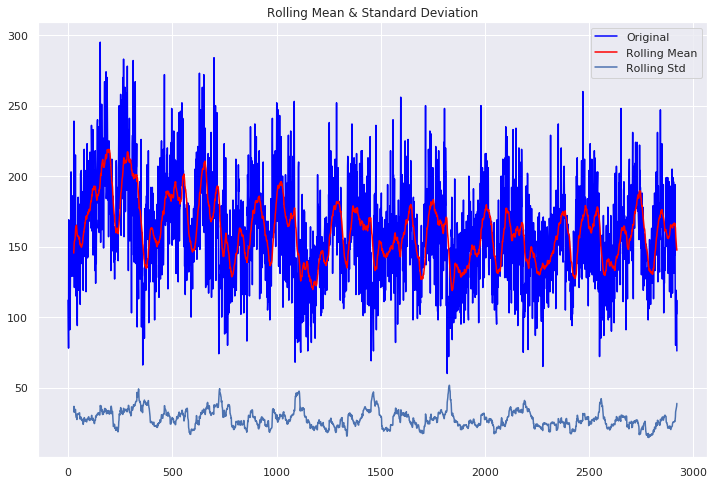

Results of Dickey-Fuller Test:
Test Statistic                   -5.312082
p-value                           0.000005
#Lags Used                       28.000000
Number of Observations Used    2893.000000
Critical Value (1%)              -3.432612
Critical Value (5%)              -2.862540
Critical Value (10%)             -2.567302
dtype: float64


In [38]:
# Some statistics :
test_stationarity(timeseries_toplot.nbr_acc , window = 28)

En statistique, le <strong>test de Dickey – Fuller</strong> teste l'hypothèse nulle selon laquelle une racine unitaire est présente dans un modèle autorégressif. L'hypothèse alternative est différente selon la version du test utilisée, mais; en d'autres termes, il s'agit généralement de la <strong>stationnarité</strong> ou de la stationnarité de tendance.
Ainsi, selon ce qu'on peut voir, la valeur p du test indique que la série est immobile. Nous ne remarquons aucune tendance significative, mais nous pouvons clairement voir les <strong>tendances saisonnières</strong>.

Regardons maintenant les graphiques d'<strong>auto-corrélation</strong> (également appelée corrélation série, de manière informelle, c’est la similitude entre les observations en fonction du décalage temporel qui les sépare):

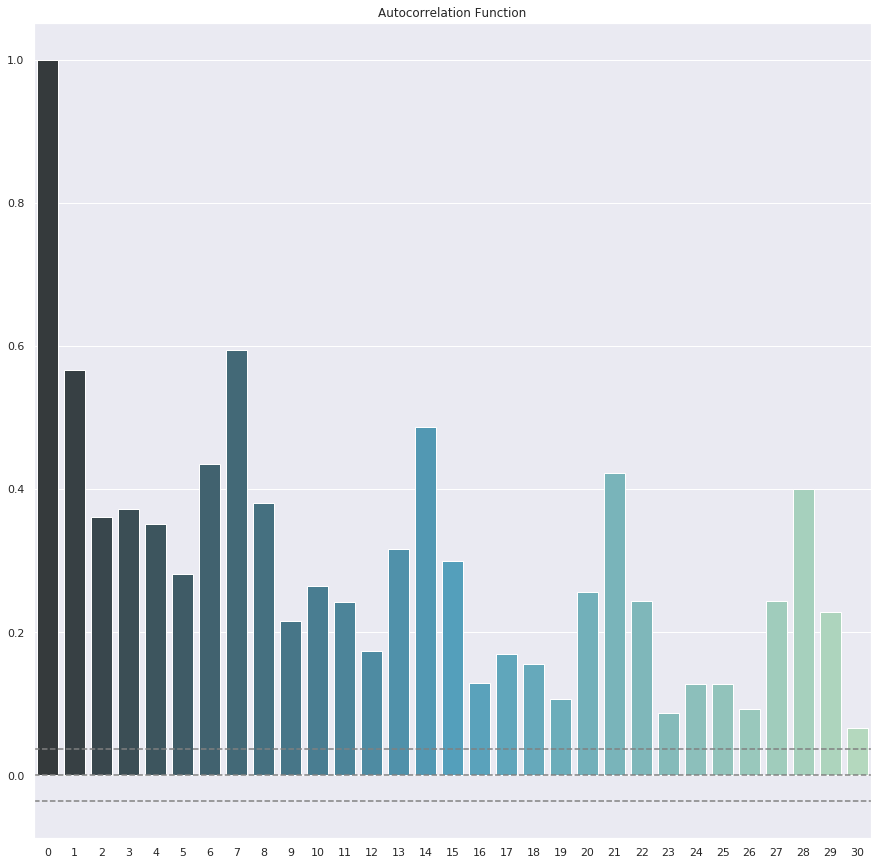

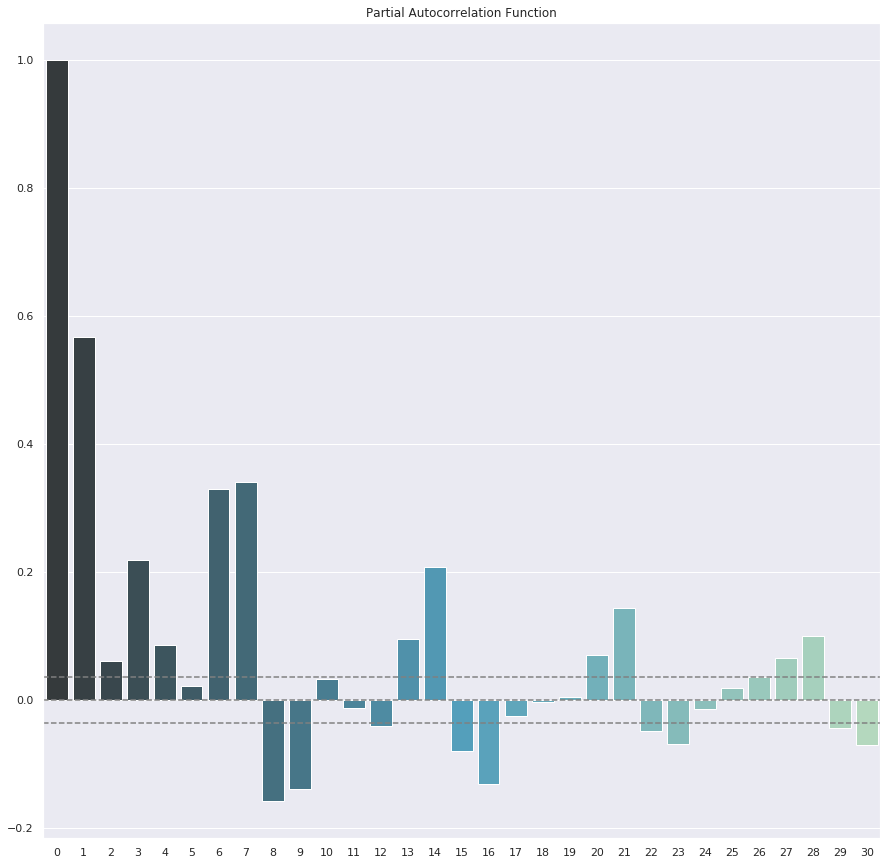

In [39]:
acp_pacp(timeseries_toplot.nbr_acc)

Ces graphiques confirment qu'il existe une forte saisonnalité dans nos données. Nous pouvons clairement voir que nous avons ici une saisonnalité hebdomadaire, donc une tendance qui se répète chaque semaine. Ce type de modèle est précieux car il nous permettra d’améliorer nos prévisions en fonction de ce qui s’est passé la semaine dernière, par exemple. Nous pouvons également noter une forte corrélation avec ce qui s'est passé la veille.

Après avoir identifié quelques motifs qui nous aideront à renforcer notre modèle à réaliser, passons maintenant à la concrétisation de notre modèle.

Pour noter nos modèles, nous allons utiliser cette fonction qui calcule un ensemble de statistiques significatives pour les prédictions que nous faisons. Nous allons tester notre modèle l'année dernière et voir comment il fonctionne.

In [27]:
def evaluate(y_true , y_pred , dates, title):
    
    try:
        true_value , prediction = y_true.sum(axis = 1), y_pred.sum(axis=1).round()
    except:
        true_value , prediction = y_true, y_pred.round()
    
    print('Mean Absolute Error   :' , round(abs(true_value - prediction).mean() , 2)) 
    print('Root Mean Square Error:' , round(sqrt(((true_value - prediction)**2).mean()) , 2) )
    print('Mean Percentage Error :' , round((abs(true_value - prediction)/true_value).mean() , 2)  )
    
    error = pd.Series(true_value - prediction)
    
    #density plot :
    print('Error Density :')
    error.plot.density()
    plt.show()
    
    # mean of error and correlation :
    print('Mean Error                       :' , round(mean(error) , 2 ))
    print('True Value And error Correlation :' , round(np.corrcoef(error , true_value)[0 , 1] , 2))
    
    # plot :
    
    to_plot = pd.DataFrame({'target' : y_true.reshape(-1) , 'prediction' : y_pred.reshape(-1)})
    
    jsplot_multiple(dates , to_plot, title)

Avant d'aller plus loin, nous devons créer un modèle «<strong>naïf</strong>» qui représentera la performance minimale acceptable pour pouvoir comparer les modèles que nous allons construire. Il s'agira d'un modèle autant simple et intuitif que possible.

Puisque nous avons de fortes tendances saisonnières et aucune tendance, nous prendrons le nombre d'accidents l'année dernière dans la même journée la même semaine que la prévision pour cette année et verrons quelles performances nous obtiendrons.

Mean Absolute Error   : 20.39
Root Mean Square Error: 27.3
Mean Percentage Error : 0.13
Error Density :


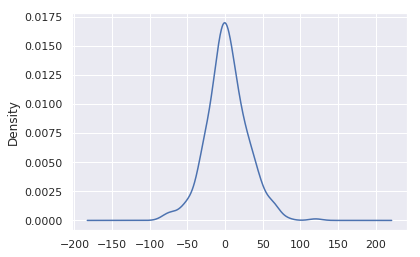

Mean Error                       : 2.52
True Value And error Correlation : 0.43


In [20]:
new, old = (timeseries_join.loc[timeseries_join.day.dt.year == 2017, ['day', 'num_acc']].reset_index(drop = True),
timeseries_join.loc[timeseries_join.day.dt.year == 2016, ['day', 'num_acc']].reset_index(drop = True))

new["nbr"] = [1 for x in new.day]
d = {
    "day" : new.groupby("day").count().index.tolist(),
    "nbr" : new.groupby("day").count().nbr.tolist()
    }
new = pd.DataFrame(data=d)

old["nbr"] = [1 for x in old.day]
d = {
    "day" : old.groupby("day").count().index.tolist(),
    "nbr" : old.groupby("day").count().nbr.tolist()
    }
old = pd.DataFrame(data=d)


old.columns = ['day' , 'old']

new['weekofyear'] , new['dayofweek'] = new.day.dt.weekofyear , new.day.dt.dayofweek
old['weekofyear'] , old['dayofweek'] = old.day.dt.weekofyear , old.day.dt.dayofweek

merged = new.merge(old, how="inner", on = ['weekofyear' , 'dayofweek'])

from math import sqrt
from numpy import mean
evaluate(merged.nbr.values , merged.old.values , new.day, "Modèle naif à mémoire = 1 année")

On voit déjà qu'on a une forte base à considérer. Ce qui est bénéfique pour nous, c'est qu'on est arrivé à une très bonne marge d'erreur en ne se basant que sur les tendances saisonnières de l'année précédente. On peut donc penser à utiliser les résultats des autres années enregistrées afin de renforcer notre modèle, et espérons qu'on arrivera à de meilleures résultats.

Mean Absolute Error   : 17.19
Root Mean Square Error: 21.64
Mean Percentage Error : 0.12
Error Density :


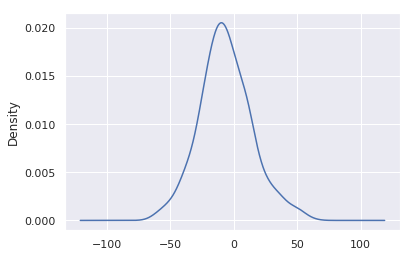

Mean Error                       : -6.28
True Value And error Correlation : 0.47


In [28]:
import matplotlib.pyplot as plt
new, old = (timeseries_join.loc[timeseries_join.day.dt.year == 2017, ['day', 'num_acc']].reset_index(drop = True),
timeseries_join.loc[timeseries_join.day.dt.year != 2017 ,
                    ['day', 'num_acc']].reset_index(drop = True))

new["nbr"] = [1 for x in new.day]
d = {
    "day" : new.groupby("day").count().index.tolist(),
    "nbr" : new.groupby("day").count().nbr.tolist()
    }
new = pd.DataFrame(data=d)

old["nbr"] = [1 for x in old.day]
d = {
    "day" : old.groupby("day").count().index.tolist(),
    "nbr" : old.groupby("day").count().nbr.tolist()
    }
old = pd.DataFrame(data=d)

old.columns = ['day' , 'old']

new['weekofyear'] , new['dayofweek'] = new.day.dt.weekofyear , new.day.dt.dayofweek
old['weekofyear'] , old['dayofweek'] = old.day.dt.weekofyear , old.day.dt.dayofweek

merged = new.merge(old, how="inner", on = ['weekofyear' , 'dayofweek'])
xx = merged.groupby("day_x").mean().old.values
yy = merged.groupby("day_x").mean().nbr.values

from math import sqrt
from numpy import mean
evaluate(yy , xx , new.day, "Modèle naif à base de moyenne et mémoire = n-1 années")

En utilisant la <strong>moyenne</strong> des 7 dernières années, on n'a pu augmenté la performance de notre modèle prédictif qu'avec <strong>1%</strong> (de 0.13 à 0.12), ce qui n'est encore pas négligeable pour un tel cas d'étude, mais reste encore du travail à faire vu qu'il y a toujours une marge d'amélioration de performance, surtout que pour cette modélisation, on n'a utilisé qu'un estimateur qui n'est pas du tout aussi performant que d'autres, et qui est la moyenne. Essayons la même technique de renforcement en prenant la <strong>médiane</strong> comme notre estimateur.

Mean Absolute Error   : 17.17
Root Mean Square Error: 22.17
Mean Percentage Error : 0.11
Error Density :


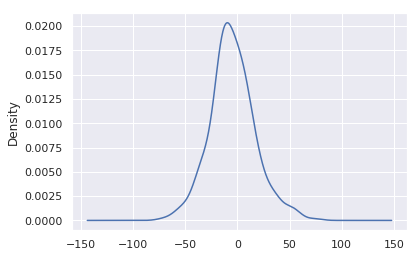

Mean Error                       : -4.53
True Value And error Correlation : 0.47


In [29]:
new_df = pd.DataFrame()
new_df["day"] = merged.groupby("day_x").count().nbr.index.tolist()
new_df["nbr"] = [merged[merged.day_x.map(lambda x: x == dday)].old.median() for dday in new_df.day]

xx = new_df.nbr.values
yy = merged.groupby("day_x").mean().nbr.values

evaluate(yy , xx , new.day, "Modèle naif à base de médiane et mémoire = n-1 années")

Voilà ainsi qu'on a encore réussi à réduire l'erreur par un autre 1%, mais cette fois d'une manière plus efficace: en réduisant l'erreur moyenne par ~ 2 degrées et préservant une corrélation de coefficient de 0.47. À vrai dire, ce qu'on a essayé de faire n'est que le début en ce qui s'agit du "forecasting" des séries temporelles, mais on peut être satisfait pour le moment pour ce qu'on est arrivé à faire sans même avoir recours aux différentes méthodes de prédiction pour séries temporelles, et c'est grâce à la saisonalité de notre série obtenue qu'on est arrivé à ce faire aisément. Pour cette modélisation, il reste encore de l'espace pour tout renforcement de notre modèle, on peut par exemple modéliser un forecast suivant la méthode <strong>ARIMA</strong> vu qu'on a déjÀ fait les tests Duckey-Fuller, ACF et PACF. On peut aussi tester ce que peut nous donner la modélisation en se basant sur la librairie <strong>"Prophet"</strong> créée par <strong>Facebook</strong>: un outil de prévision développé par Facebook pour sa planification de la capacité. Il est très efficace lorsqu'il s'agit de problèmes à taille humaine vu qu'il est basé sur des modèles additifs généralisés.

Finalement, notre deuxième pseudo-modèle est prêt au déploiement: il s'agira donc d'un API de collecte de données (vu que c'est un modèle se basant sur une longue mémoire) qui prédira le nombre d'accidents pour chaque jour dans le pays, et peut même être personnalisée pour qu'il fasse les prédictions sur un département bien déterminée ou une commune quelconque. <small><u>(Il suffit d'alimenter le modèle par une base de données riche et bien partitionnée)</u></small>

Résumons donc ce qu'on a fait jusqu'à maintenant en ce qui concerne la modélisation:
- D'abord, on est arrivé à créer un modèle de <strong>classification de la sécurité des accidentés</strong> pour le soutien des services SOS et l'optimisation de l'utilisabilité de leurs ressources matérielles
- On a ensuite créé un modèle de <strong>prédiction du nombre d'accidents par séries temporelles</strong> qui peut être personnalisé par département ou même par commune

C'est ainsi qu'on abordera maintenant notre dernière modélisation qui s'agira d'un modèle de soutien à la <strong>restructuration des cartes routières francaises</strong>. En statistiques, en économétrie et en apprentissage automatique, un modèle de <strong>régression</strong> est un modèle qui cherche à <strong>établir une relation</strong> entre une variable, dite expliquée, et une ou plusieurs variables, dites explicatives. On trouvera pas donc mieux que la régression pour assister notre enquête de fouille de relations entre toutes les variables étudiées pour améliorer la structure routière du pays en question.

In [17]:
# without the date columns replacement
timeseries_join.head(5)

,num_acc,an,mois,jour,insee,heure_min,numero_route,nbre_voies,largeur_tpc,largeur_route,...,Souterrain - tunnel,Voie ferrée,Zone de péage,Zone piétonne,Sur accotement,Sur bande d'arrêt d'urgence,Sur chaussée,Sur piste cyclable,Sur trottoir,counted
40043,201000040487,10,1,1,67482,20,0,1,0,36,...,0,0,0,0,0,0,0,0,1,1
10041,201000009150,10,1,1,57634,45,7,2,0,70,...,0,0,0,0,1,0,0,0,0,1
30284,201000028688,10,1,1,33063,45,0,0,0,12,...,0,0,0,0,0,0,1,0,0,1
30286,201000028690,10,1,1,33063,55,0,6,0,0,...,0,0,0,0,0,0,1,0,0,1
13079,201000011738,10,1,1,13107,75,8,2,0,56,...,0,0,0,0,0,0,1,0,0,1


Dans notre troisième modélisation, on vise à attaquer la minimisation du nombre d'accidents dans chaque route / commune / departement, c'est pourquoi qu'on va s'intéresser qu'à la structure, la localisation, et les conditions de la carte routière puisque ce sont les premiers facteurs qu'on peut intervenir pour régler. Ensuite, on regroupera notre dataset suivant le code insee (revient donc à regrouper les lignes par communes et département), le numéro de la route, sa largeur, la largeur de sa terre pleine centrale et la proximité des écoles concernant la zone de l'accident.

Le "dummy coding" (l'extraction des modalités des variables catégoriques en colonnes) qu'on a déjà fait nous aidera à identifier le nombre d'accidents par modalité (ex: <u>counted</u> (nombre d'accidents) = 3 et <u>Plein Jour</u> = 2 revient à montrer que 2 accidents de ces 3 sont survenus en plein jour).

C'est ainsi qu'on obtiendra ce dataset ci dessous, qui nous aidera à construire notre fonction d'extraction d'associations entre les facteurs étudiés par régression.

In [30]:
timeseries_join["counted"] = [1 for x in timeseries_join.values]
regression_join = timeseries_join.drop(["num_acc", "an", "mois",
                                        "jour", "heure_min"], axis=1).groupby(by=["insee",
                                                                                  "numero_route",
                                                                                  "largeur_route",
                                                                                  "largeur_tpc",
                                                                                  "proximite_ecole",
                                                                                  "nbre_voies"
                                                                                 ]).sum()
#regression_join.largeur_tpc = regression_join.largeur_tpc / regression_join.counted
#regression_join.largeur_route = regression_join.largeur_route / regression_join.counted
#regression_join.proximite_ecole = regression_join.proximite_ecole / regression_join.counted
regression_join.head(15)

Crépuscule ou aube  \
insee numero_route largeur_route largeur_tpc proximite_ecole nbre_voies                       
1001  7            65            0           99              2                          0.0   
      64           60            0           0               2                          0.0   
                                             99              2                          0.0   
                   70            70          99              2                          0.0   
1002  63           55            55          0               1                          0.0   
1004  0            0             0           0               0                          0.0   
                                                             1                          0.0   
                                                             2                          0.0   
                                                             3                          0.0   
                                             99              0                          0.0   
                                                             2                          0.0   
                                 50          3               0                          0.0   
                   30            0           0               1                          0.0   
                   35            0           99              2                          0.0   
                   50            0           0               0                          0.0   

                                                                         Nuit avec éclairage public allumé  \
insee numero_route largeur_route largeur_tpc proximite_ecole nbre_voies                                      
1001  7            65            0           99              2                                         0.0   
      64           60            0           0               2                                         0.0   
                                             99              2                                         0.0   
                   70            70          99              2                                         0.0   
1002  63           55            55          0               1                                         0.0   
1004  0            0             0           0               0                                         1.0   
                                                             1                                         0.0   
                                                             2                                         0.0   
                                                             3                                         1.0   
                                             99              0                                         1.0   
                                                             2                                         0.0   
                                 50          3               0                                         0.0   
                   30            0           0               1                                         0.0   
                   35            0           99              2                                         0.0   
                   50            0           0               0                                         1.0   

                                                                         Nuit avec éclairage public non allumé  \
insee numero_route largeur_route largeur_tpc proximite_ecole nbre_voies                                          
1001  7            65            0           99              2                                             0.0   
      64           60            0           0               2                                             0.0   
                                             99              2                                             0.0   
                

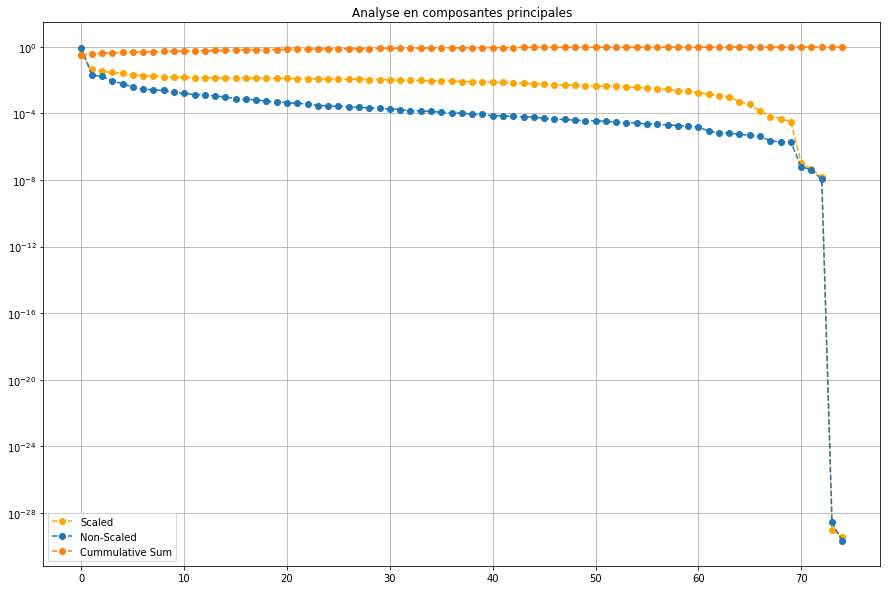

In [83]:
target_counted = regression_join.counted.tolist()
regression_join.drop(columns=["counted"], axis=1, inplace=True)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

z_scaler = StandardScaler()
scaled = z_scaler.fit_transform(regression_join)
pca_trafo = PCA().fit(scaled)
pca_trafo_nonscaled = PCA().fit(regression_join)

plt.figure(figsize=(15,10))
plt.grid(True)
plt.title("Analyse en composantes principales")
plt.semilogy(pca_trafo.explained_variance_ratio_, '--o', label="Scaled", color="orange")
plt.semilogy(pca_trafo_nonscaled.explained_variance_ratio_, '--o', label="Non-Scaled")
plt.semilogy(pca_trafo.explained_variance_ratio_.cumsum(), '--o', label="Cummulative Sum");
plt.legend(loc="best");

Remarquons ainsi qu'après l'analyse ACP, il s'est avéré qu'avec seulement 30 variables sélectionnées, on peut exprimer 98,2% de la variance totale dans notre dataset. Une remarque très importante peut être pour la création et le renforcement d'un modèle prédictif, mais dans notre cas, on a effectué cet analyse pour valider la pseudo-égalité entre l'information apportée par chaque variable dans nos données, ce qui nous affirmera l'utilisabilité de toutes nos variables dans notre modèle pour qu'on puisse vraimenet extraire une association significative entre elles.

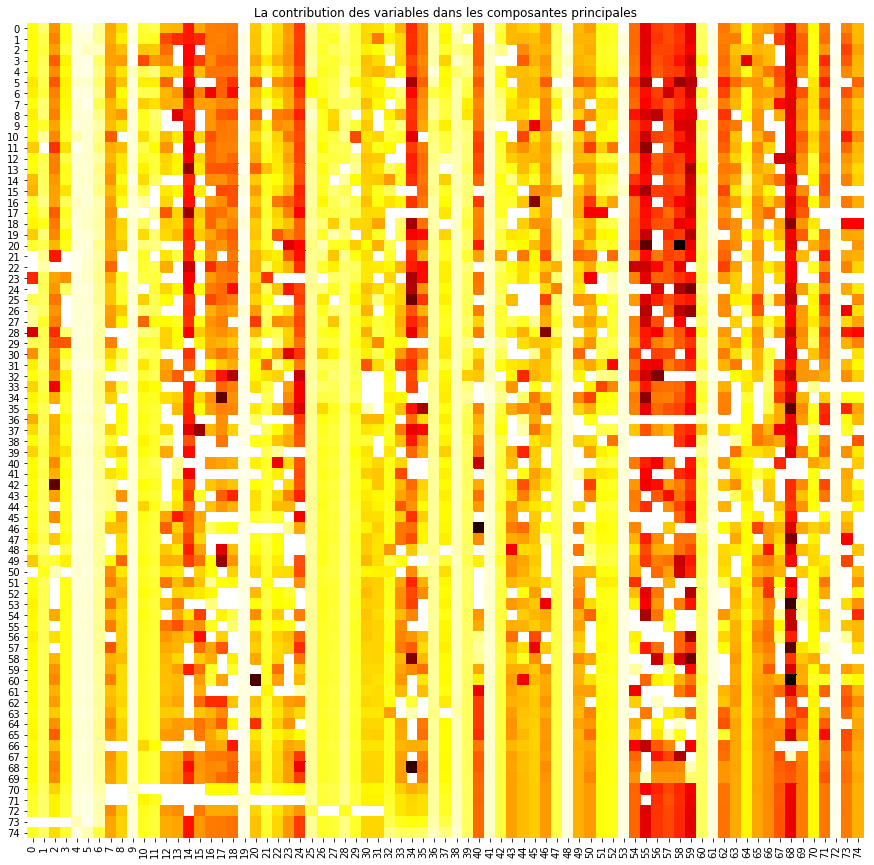

In [87]:
plt.figure(figsize=(15,15))
plt.title("La contribution des variables dans les composantes principales")
sns.heatmap(np.log(pca_trafo_nonscaled.inverse_transform(np.eye(regression_join.shape[1]))),
            cmap="hot", cbar=False);

In [130]:
from sklearn import linear_model
lm = linear_model.LinearRegression()
model = lm.fit(regression_join[:200000],target_counted[:200000])
predictions = lm.predict(regression_join[200000:])
d = {
    "target_count" : target_counted[200000:],
    "predicted_count" : predictions
}
categorical_result_dataframe = pd.DataFrame(data=d)
categorical_result_dataframe.head(15)

,target_count,predicted_count
0,1,1.0
1,1,1.0
2,1,1.0
3,1,1.0
4,1,1.0
5,1,1.0
6,1,1.0
7,1,1.0
8,1,1.0
9,3,3.0


In [131]:
# metrics
print("Score: ", lm.score(regression_join[200000:], target_counted[200000:]))
print("Liste des coefficients à déterminer:\n", lm.coef_)
print("Intercept: ", lm.intercept_)

Score:  1.0
Liste des coefficients à déterminer:
 [-3.76145550e-01 -3.76145550e-01 -3.76145550e-01 -3.76145550e-01
 -3.76145550e-01  2.25672292e+00  2.25672292e+00 -5.60107516e-14
 -2.23654428e-13 -2.34923192e-13 -2.40779618e-13 -2.35034214e-13
 -2.41501263e-13 -2.26041408e-13 -2.76387420e-13 -2.31759056e-13
 -2.62057737e-13 -2.73264050e-13 -2.75120204e-13 -2.72004641e-13
 -2.69034794e-13 -2.68673972e-13 -2.82773804e-13 -2.76272061e-13
 -2.36628425e-13 -3.78697074e-13 -3.81805698e-13 -3.79266063e-13
 -3.76698672e-13 -3.77031739e-13 -3.88730714e-13 -3.72882281e-13
 -8.80577370e-01 -8.80577370e-01 -8.80577370e-01 -8.80577370e-01
 -8.80577370e-01 -8.80577370e-01 -8.80577370e-01 -1.13797860e-15
  2.24299745e-15 -1.27675648e-15 -1.88737914e-15  4.52415883e-15
 -1.08593690e-15 -1.39610545e-14 -1.91860416e-15  2.70616862e-15
 -1.11022302e-16  5.26662047e-15  9.25821919e-15  1.13520304e-14
 -2.09554596e-15  4.99600361e-15 -4.44540238e-14 -6.28620420e-16
 -8.76035355e-16  1.44658591e-14  4.6204

On est ainsi arrivé à définir une équation de parfaite prédiction, en fonction des modalités catégoriques de nos données. Reste à vérifier s'il s'agit vraiment d'un résultat non biaisé. Par contre, même si le résultat est parfait pour une telle étude, on ne peut pas considérer son résultat vu qu'on n'a pas pris en considération les variables numériques.

Ce qu'on essaiera de faire maintenant est le suivant, on éliminera tout variable qu'on a pas vraiment accès à affecter, pour ne rester qu'avec celles que l'état peut intervenir à modifier comme la largeur de la route, la proximité aux écoles, le nombre des voies, etc. On déterminera ainsi la gravité de chaque accident suivant l'état des accidentés, enfin, on essaiera de créer un modèle de régression qui aura comme cible, cette gravité de l'accident, c'est ainsi qu'on pourra extraire une relation bien définie des facteurs sélectionnés et de la gravité des accidents pour enfin créer un modèle qui nous aidera à savoir les facteurs qu'on a besoin à agir dessus pour diminuer cette gravité.

In [31]:
timeseries_join.drop("counted", inplace=True, axis=1, errors="ignore")
timeseries_join.reset_index(drop=True, inplace=True)
usable_usagers = usagers_list[0][["num_acc", "trajet", "gravite_etat"]]

for colum in ['num_acc']:
    usable_usagers[colum] = usable_usagers[colum].apply(lambda x : switch_base_ifneeded(x))

categorical_data = usable_usagers.drop(['num_acc', "gravite_etat"], axis=1)

usable_usagers = usable_usagers[["num_acc", "gravite_etat"]]

for column in categorical_data.columns.values.tolist():
    usable_usagers = pd.concat([usable_usagers,
                                 pd.get_dummies(categorical_data[column]).drop(['Pas définie'],
                                                                               axis=1,
                                                                               errors='ignore')], axis=1)

grav_modalites = {
    'Pas définie' : 2,
    'Indemne' : 1,
    'Tué' : 4,
    'Blessé hospitalisé' : 3,
    'Blessé léger' : 2
}

usable_usagers.gravite_etat = usable_usagers.gravite_etat.apply(lambda x : grav_modalites.get(x))
regression_usagers = usable_usagers.groupby("num_acc").mean()
to_join = pd.DataFrame()
to_join["num_acc"] = regression_usagers.index.tolist()
to_join["gravite_acc"] = regression_usagers[["gravite_etat"]].values
regression_join = pd.merge(timeseries_join, to_join, how='inner', on='num_acc')
regression_join.drop(["an", "mois", "jour", "heure_min"], axis=1, inplace=True)
regression_join.head(15)

,num_acc,insee,numero_route,nbre_voies,largeur_tpc,largeur_route,proximite_ecole,Crépuscule ou aube,Nuit avec éclairage public allumé,Nuit avec éclairage public non allumé,...,Voie ferrée,Zone de péage,Zone piétonne,Sur accotement,Sur bande d'arrêt d'urgence,Sur chaussée,Sur piste cyclable,Sur trottoir,day,gravite_acc
0,201000040487,67482,0,1,0,36,0,0,1,0,...,0,0,0,0,0,0,0,1,2010-01-01,1.750000
1,201000009150,57634,7,2,0,70,0,0,0,0,...,0,0,0,1,0,0,0,0,2010-01-01,1.750000
2,201000028688,33063,0,0,0,12,0,0,1,0,...,0,0,0,0,0,1,0,0,2010-01-01,1.500000
3,201000028690,33063,0,6,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,2010-01-01,2.000000
4,201000011738,13107,8,2,0,56,99,0,0,0,...,0,0,0,0,0,1,0,0,2010-01-01,1.200000
5,201000014232,77492,-1,2,0,51,99,0,1,0,...,0,0,0,0,0,1,0,0,2010-01-01,3.500000
6,201000066162,75116,0,3,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,2010-01-01,2.000000
7,201000022730,13201,1,1,0,60,0,0,1,0,...,1,0,0,0,0,0,0,0,2010-01-01,1.500000
8,201000064133,75116,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,2010-01-01,1.500000
9,201000052995,94076,55,2,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,2010-01-01,2.500000


In [416]:
target_counted = regression_join.gravite_acc.tolist()
regression_join.drop(columns=["gravite_acc"], axis=1, inplace=True)

lm = linear_model.LinearRegression()
model = lm.fit(regression_join,target_counted)
predictions = lm.predict(regression_join)
d = {
    "target_count" : target_counted,
    "predicted_count" : predictions
}
gravity_result_dataframe = pd.DataFrame(data=d)
gravity_result_dataframe.head(15)

,target_count,predicted_count
0,1.750000,2.319409
1,1.750000,3.110526
2,1.500000,1.951438
3,2.000000,1.950884
4,1.200000,2.337945
5,3.500000,2.280789
6,2.000000,1.791439
7,1.500000,2.119096
8,1.500000,1.578940
9,2.500000,2.182789


In [417]:
# metrics
print("Score: ", lm.score(regression_join, target_counted))
print("Liste des coefficients à déterminer:\n", lm.coef_)
print("Intercept: ", lm.intercept_)

Score:  0.3704475701248654
Liste des coefficients à déterminer:
 [-6.96383689e-06  1.73795909e-06  2.18350804e-06 -1.63328800e-02
  2.54207127e-04  3.26435858e-04  3.11800904e-05 -4.56415991e-02
  1.56682414e-02  4.49876380e-02  6.85543992e-02 -8.35686795e-02
 -9.81844659e-02  9.81844659e-02  1.27081060e-02 -1.76920362e-02
  1.55044414e-02 -3.39828386e-02 -2.49986531e-02 -2.24542473e-02
  1.38136637e-02  7.82821184e-02 -2.11805544e-02 -4.06088048e-01
 -4.19608758e-01 -4.75439397e-01 -4.55459960e-01 -4.63572763e-01
 -4.72701965e-01 -4.42544505e-01 -4.46771751e-01 -3.88145830e-01
 -2.06519684e-01 -3.61553391e-01 -5.12073701e-01 -4.52930363e-01
 -4.27149204e-02 -6.52457857e-01 -6.76708909e-01 -4.67688845e-02
  4.98618578e-02 -1.15792104e-02 -1.35151761e-01  7.72997916e-02
  7.06988348e-02 -4.36062771e-03  6.08339896e-03  5.41519102e-02
  5.10431146e-02  3.08867387e-02  1.66492804e-02 -1.64390745e-02
 -6.49941804e-03  2.11190664e-02  1.24189202e-02 -2.12540769e-02
  2.54390976e-02  5.04493

On voit ainsi que certes, on est arrivé à notre objectif, mais le problème dans ce modèle est son score. 37% n'est pas une valeur qu'on peut considérer pour suivre les résultats de notre modèle, même si on est arrivé à extraire l'équation souhaitée.

Une solution alternative, est de réutiliser les algorithmes de <strong>Random Forest</strong> et de <strong>XGBoost</strong> pour la régression afin de réaliser cette régression souhaitée, et notre solution de contournement; à la place de l'extraction des associations entre le résultat cible et les autres variables, sera d'extraire les variables les plus importantes dans notre régression effectuée et les ordonner en ordre descendant d'importance pour enfin obtenir les axes d'étude et d'intervention qu'on doit attaquer si on veut diminuer la gravité des accidents.

In [103]:
labels = np.array(regression_join.gravite_acc)
features = regression_join.drop(['gravite_acc', 'day', 'num_acc'], axis = 1)
feature_list = list(features.columns)
features = np.array(features)
train_features, test_features, train_labels, test_labels = train_test_split(features, labels,
                                                                            test_size = 0.25, random_state = 49)
print('Variables de training', train_features.shape)
print('Variable cible de training:', train_labels.shape)
print('Variable de test:', test_features.shape)
print('Variable cible de test:', test_labels.shape)

Variables de training (49738, 81)
Variable cible de training: (49738,)
Variable de test: (16580, 81)
Variable cible de test: (16580,)


In [270]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 1000, random_state=49, n_jobs=-1)
rf.fit(train_features, train_labels);
predictions = rf.predict(test_features)

# Feature Importances
feature_imp = pd.Series(rf.feature_importances_,index=feature_list).sort_values(ascending=False)

# Calculate the absolute errors
errors = abs(predictions - test_labels)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / test_labels)
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.32 degrees.
Accuracy: 83.48 %.


In [104]:
import xgboost
xgb = xgboost.XGBRegressor(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.34,
                           colsample_bytree=1, max_depth=7, n_jobs=-1)
xgb.fit(train_features, train_labels);
predictions = xgb.predict(test_features)
feature_imp = pd.Series(xgb.feature_importances_,index=feature_list).sort_values(ascending=False)

# Calculate the absolute errors
errors = abs(predictions - test_labels)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / test_labels)
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.32 degrees.
Accuracy: 83.55 %.


Après création des modèles basés sur les algorithmes du Random Forest et du XGBoost, on remarque qu'au deuxième modèle, on n'a pas pu réduire le <strong>MAE</strong> (Moyenne absolue d'erreur), mais on est arrivé quand même à augmenter la performance du modèle en augmentant sa précision. C'est ainsi qu'après une visualition bien précise des résultats, qu'on annoncera notre modèle gagnant pour cette dernière modélisation.

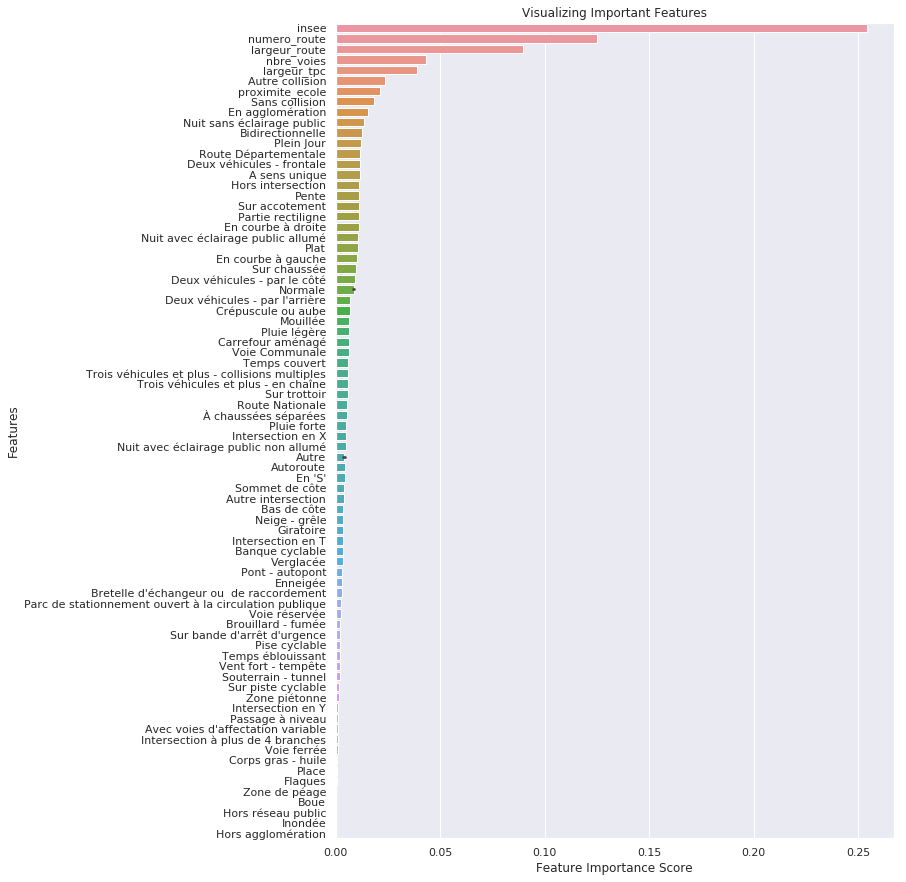

In [107]:
# Creating a bar plot
plt.figure(figsize=(10,15))
sns.barplot(x=feature_imp, y=feature_imp.index)

# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show();

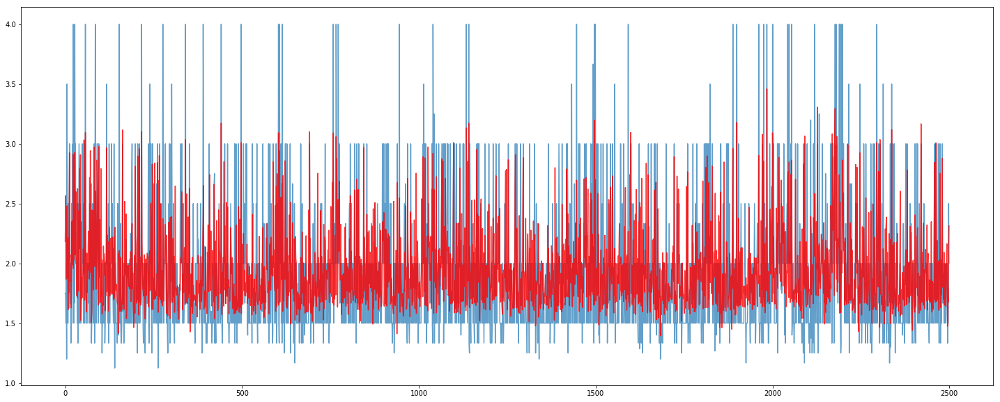

In [437]:
predictions = xgb.predict(features)
plt.figure(figsize=(25,10))
plt.plot(regression_join["gravite_acc"][:2500],alpha=0.7)
plt.plot(predictions[:2500], color="r", alpha=0.8);

Voilà donc qu'on peut observer la performance améliorée de notre dernier modèle réalisée. On aura recours à une dernière projection des résultats et du dataset obtenu sur des séries temporelles pour mettre en évidence la performance de notre modèle et on entame ensuite l'exportation de notre modèle pour le déploiement.

In [98]:
to_plot = pd.DataFrame({'target' : regression_join[regression_join.insee == 67482].gravite_acc.values.reshape(-1),
                        'prediction' : xgb.predict(features).reshape(-1)})
jsplot_multiple(regression_join[regression_join.insee == 67482].day, to_plot,
                "Modèle de régression sur gravité des accidents basé sur l'algorithme XGBoost")

In [99]:
filename = 'gravity_regression_model.sav'
pickle.dump(xgb, open(filename, 'wb'))

Finalement, après avoir fini avec la phase de modélisation où on a construit 3 modèles préliminaires prêts à l'emploi, on est apte à appréhender la phase de déploiement qui consiste en <strong>développement des API (Rest ou GraphQL)</strong> des 2 services à développer:
- Le service de classification de sécurité des accidentés en cas d'alerte accident
- Le service de prédiction journalière du nombre d'accidents personnalisé (par commune/déploiement)
- Le service de soutien d'intervention sur la carte routière francaise

## Conclusion
Pour conclure ce projet, on peut énoncer qu'il reste encore beaucoup de travail d'optimisation et de renforcement pour nos trois modèles pour être prêts à l'échelle de production. Par exemple, même si on est arrivé enfin à créer un modèle de prédiction aussi performant à base de séries temporelles, on peut encore le renforcer ou même explorer d'autres techniques et algorithmes comme les <strong>LSTMs (Long-Short Term Memory models)</strong>. Ensuite, on peut poser comme perspectives à notre projet, l'exploration du monde du <strong>Deep Learning</strong> vu qu'on pourra créer de modèles plus pertinents et plus prêts à l'échelle de production, avec la particularité du <strong>Continuous Learning</strong> comme ceux créés par les services AWS de Amazon et Azure de Microsoft.